In [1]:
import os
import csv
import sys
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import scipy.optimize as opt
import scipy.stats as stat
from operator import itemgetter
import random
import numpy as np
import numpy.ma as ma
import numpy.linalg as la

pi = np.pi
sin = np.sin
cos = np.cos

In [2]:
os.chdir('..')
cwd = os.getcwd()
cwd

'/Users/mike_mckenna/Desktop/brain-diffusion/Chad_functions_and_unittests'

In [3]:
MSD_dict = dict()

MSD_dict[1] = np.genfromtxt('./Data_Files_Mike/8_1_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_YG_COOH_0-2p_agarose_1.csv', delimiter = ',')
MSD_dict[2] = np.genfromtxt('./Data_Files_Mike/8_1_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_YG_COOH_0-4p_agarose_1.csv', delimiter = ',')
MSD_dict[3] = np.genfromtxt('./Data_Files_Mike/8_1_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_YG_COOH_0-8p_agarose_1.csv', delimiter = ',')
MSD_dict[4] = np.genfromtxt('./Data_Files_Mike/8_1_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_YG_PEG_0-2p_agarose_1.csv', delimiter = ',')
MSD_dict[5] = np.genfromtxt('./Data_Files_Mike/8_1_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_YG_PEG_0-4p_agarose_1.csv', delimiter = ',')
MSD_dict[6] = np.genfromtxt('./Data_Files_Mike/8_1_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_YG_PEG_0-8p_agarose_1.csv', delimiter = ',')

In [4]:
print(len(MSD_dict[1]))
print(len(MSD_dict[2]))
print(len(MSD_dict[3]))
print(len(MSD_dict[4]))
print(len(MSD_dict[5]))
print(len(MSD_dict[6]))
print(MSD_dict[1][1:len(MSD_dict[1])])
print(MSD_dict[1][1:])
print(len(MSD_dict[1][1:len(MSD_dict[1])]))

28
28
28
28
28
27
[ 0.00463877  0.00464741  0.00475151  0.00461223  0.00452475  0.00441675
  0.00439811  0.00447344  0.0041147   0.0041497   0.00405964  0.00378876
  0.0039506   0.00424964  0.00387984  0.0038951   0.00375602  0.00400245
  0.00383642  0.00341746  0.00337512  0.00350889  0.00313082  0.00313586
  0.00346093  0.00306809  0.00163697]
[ 0.00463877  0.00464741  0.00475151  0.00461223  0.00452475  0.00441675
  0.00439811  0.00447344  0.0041147   0.0041497   0.00405964  0.00378876
  0.0039506   0.00424964  0.00387984  0.0038951   0.00375602  0.00400245
  0.00383642  0.00341746  0.00337512  0.00350889  0.00313082  0.00313586
  0.00346093  0.00306809  0.00163697]
27


In [5]:
fps_vals = [2.85, 2.85, 2.86, 2.87, 2.84, 2.84]

time_dict = dict()

i = 1
while i <= len(MSD_dict):
    time_dict[i] = np.zeros(len(MSD_dict[i]))
    p = 0
    while p < len(time_dict[i]):
        time_dict[i][p] = p/fps_vals[i-1]
        p += 1
    i += 1

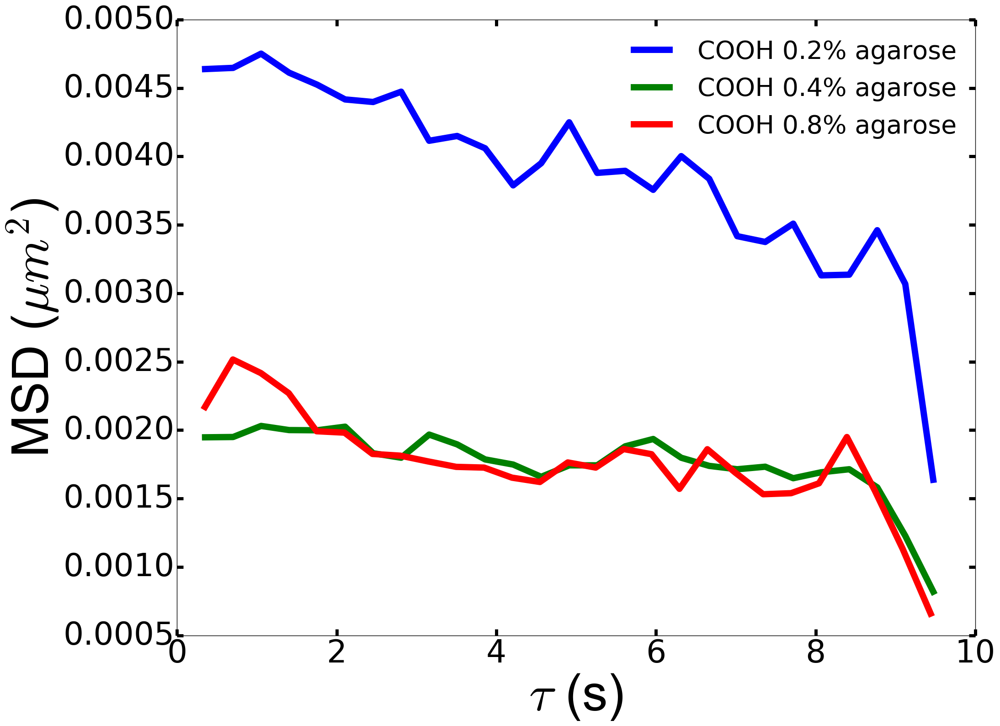

In [6]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict[1][1:], MSD_dict[1][1:], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict[2][1:], MSD_dict[2][1:], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict[3][1:], MSD_dict[3][1:], linewidth=10, label = 'COOH 0.8% agarose')
ax.legend(loc = (0.55, 0.79),frameon=False,fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.1.17 - COOH_MSDs_varying agarose conc_full duration.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


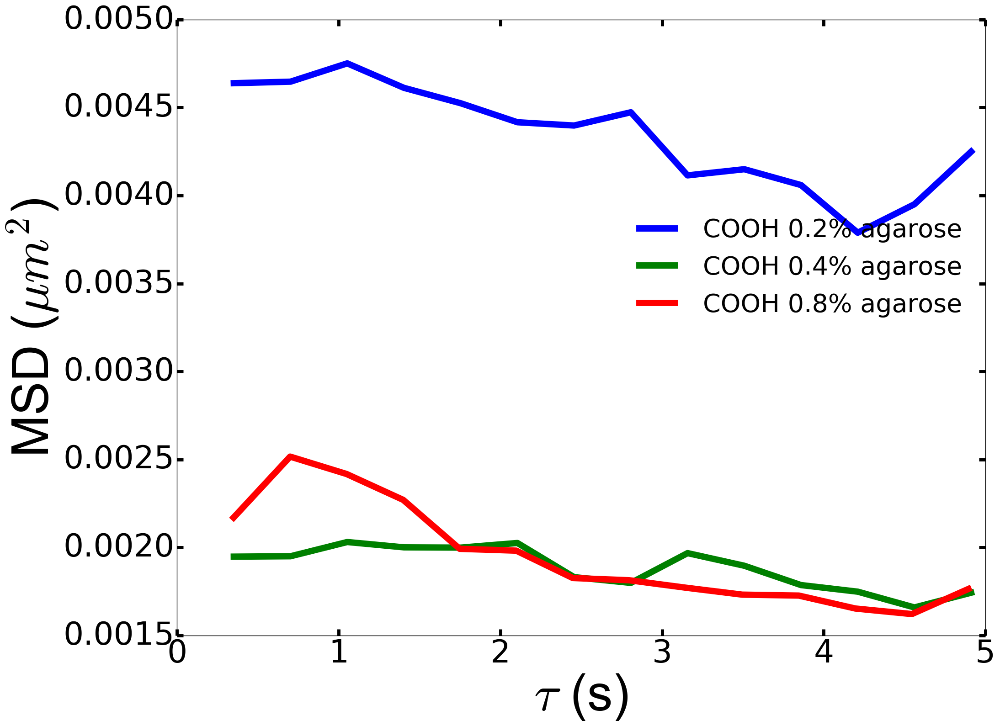

In [7]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict[1][1:(np.ceil(5*fps_vals[0]))], MSD_dict[1][1:(np.ceil(5*fps_vals[0]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict[2][1:(np.ceil(5*fps_vals[0]))], MSD_dict[2][1:(np.ceil(5*fps_vals[0]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict[3][1:(np.ceil(5*fps_vals[0]))], MSD_dict[3][1:(np.ceil(5*fps_vals[0]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.legend(loc = (0.55, 0.5),frameon=False,fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.1.17 - COOH_MSDs_varying agarose conc_5 seconds.png', dpi=fig.dpi)

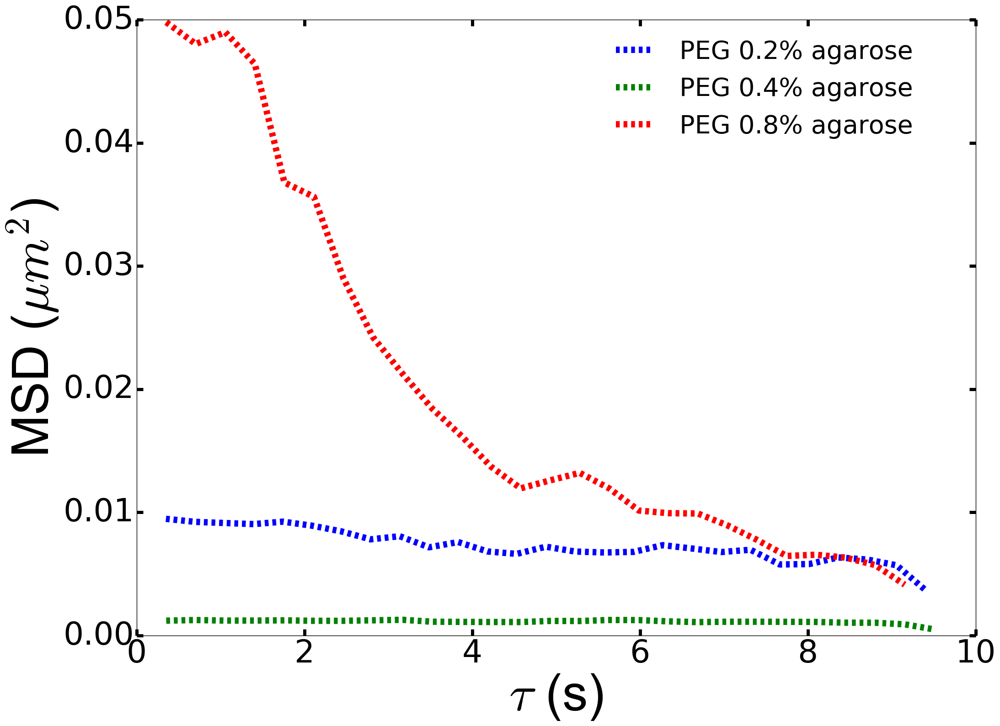

In [8]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict[4][1:], MSD_dict[4][1:], linewidth=10, linestyle = 'dashed', label = 'PEG 0.2% agarose')
ax.plot(time_dict[5][1:], MSD_dict[5][1:], linewidth=10, linestyle = 'dashed', label = 'PEG 0.4% agarose')
ax.plot(time_dict[6][1:], MSD_dict[6][1:], linewidth=10, linestyle = 'dashed', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.55, 0.79),frameon=False,fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.1.17 - PEG_MSDs_varying agarose conc_full duration.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


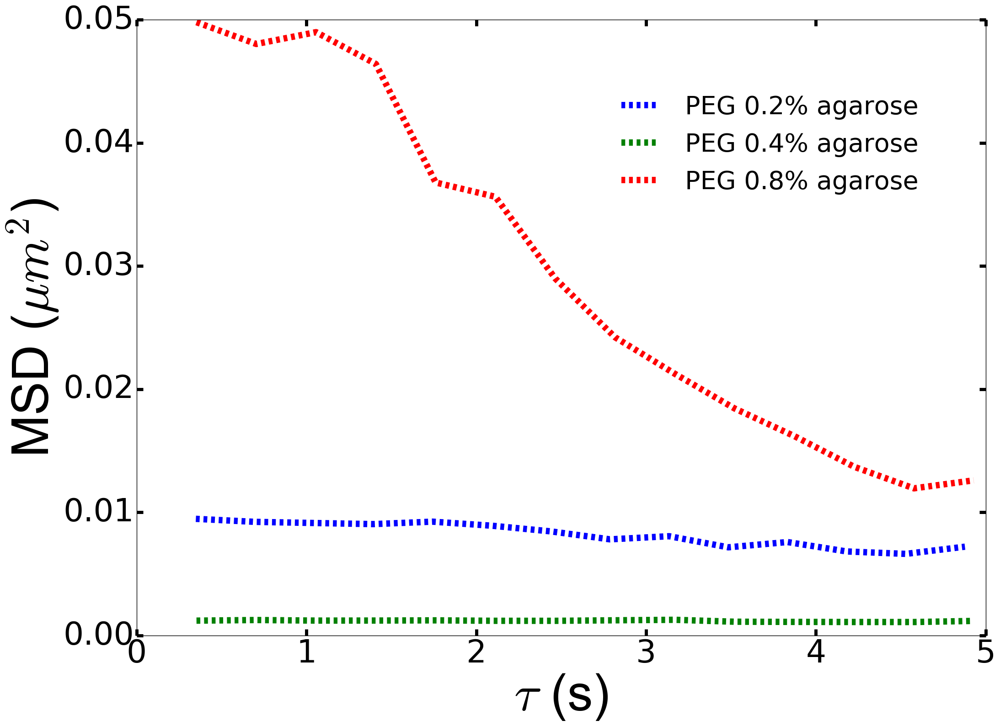

In [9]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict[4][1:(np.ceil(5*fps_vals[0]))], MSD_dict[4][1:(np.ceil(5*fps_vals[0]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.2% agarose')
ax.plot(time_dict[5][1:(np.ceil(5*fps_vals[0]))], MSD_dict[5][1:(np.ceil(5*fps_vals[0]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.4% agarose')
ax.plot(time_dict[6][1:(np.ceil(5*fps_vals[0]))], MSD_dict[6][1:(np.ceil(5*fps_vals[0]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.55, 0.7),frameon=False,fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.1.17 - PEG_MSDs_varying agarose conc_5 seconds.png', dpi=fig.dpi)

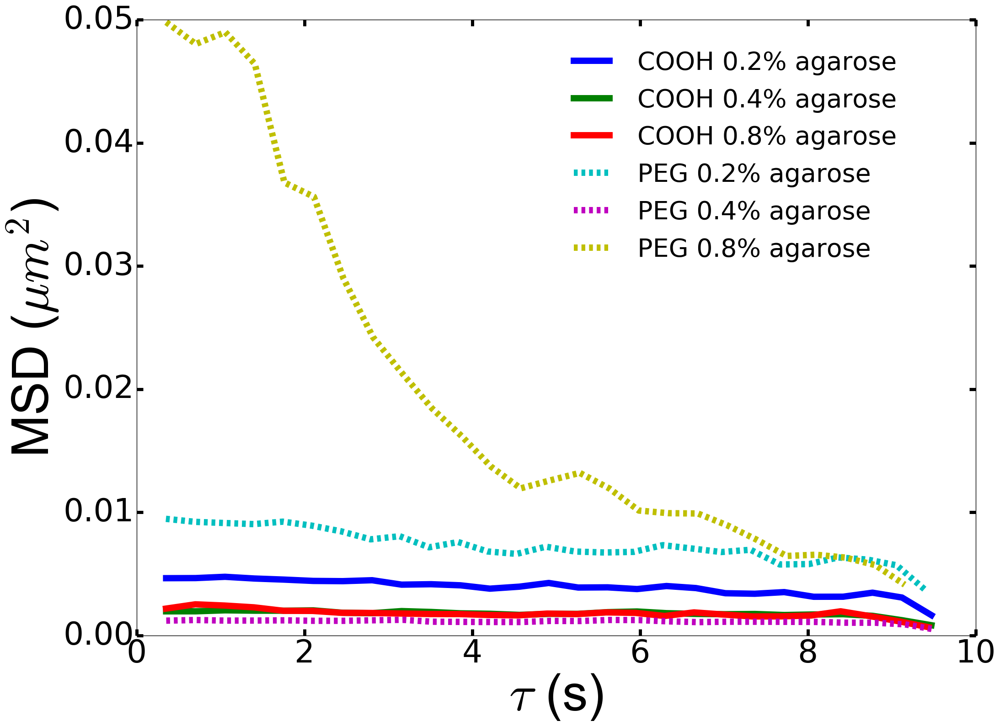

In [10]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict[1][1:], MSD_dict[1][1:], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict[2][1:], MSD_dict[2][1:], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict[3][1:], MSD_dict[3][1:], linewidth=10, label = 'COOH 0.8% agarose')
ax.plot(time_dict[4][1:], MSD_dict[4][1:], linewidth=10, linestyle = 'dashed', label = 'PEG 0.2% agarose')
ax.plot(time_dict[5][1:], MSD_dict[5][1:], linewidth=10, linestyle = 'dashed', label = 'PEG 0.4% agarose')
ax.plot(time_dict[6][1:], MSD_dict[6][1:], linewidth=10, linestyle = 'dashed', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.5, 0.59),frameon=False,fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.1.17 - MSDs_varying agarose conc_full duration.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

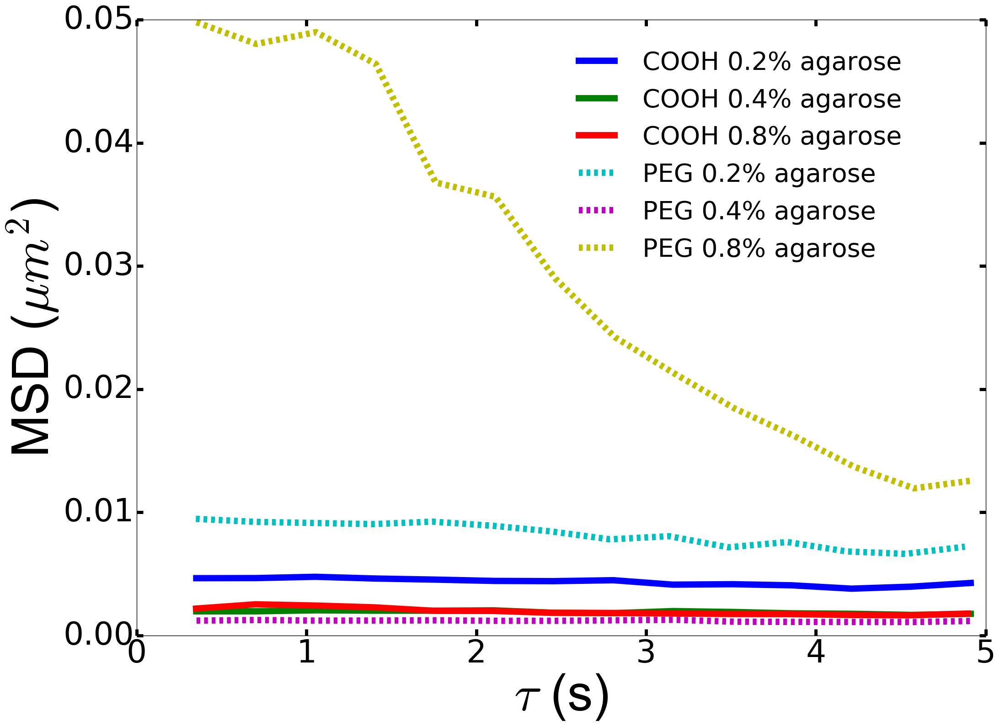

In [11]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict[1][1:(np.ceil(5*fps_vals[0]))], MSD_dict[1][1:(np.ceil(5*fps_vals[0]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict[2][1:(np.ceil(5*fps_vals[0]))], MSD_dict[2][1:(np.ceil(5*fps_vals[0]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict[3][1:(np.ceil(5*fps_vals[0]))], MSD_dict[3][1:(np.ceil(5*fps_vals[0]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.plot(time_dict[4][1:(np.ceil(5*fps_vals[0]))], MSD_dict[4][1:(np.ceil(5*fps_vals[0]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.2% agarose')
ax.plot(time_dict[5][1:(np.ceil(5*fps_vals[0]))], MSD_dict[5][1:(np.ceil(5*fps_vals[0]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.4% agarose')
ax.plot(time_dict[6][1:(np.ceil(5*fps_vals[0]))], MSD_dict[6][1:(np.ceil(5*fps_vals[0]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.5, 0.59),frameon=False,fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.1.17 - MSDs_varying agarose conc_5 seconds.png', dpi=fig.dpi)

In [12]:
MSD_dict_2 = dict()

MSD_dict_2[1] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_2[2] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_2[3] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_2[4] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_2[5] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_2[6] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_2[7] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_2[8] = np.genfromtxt('./Data_Files_Mike/8_10_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')

In [13]:
print(len(MSD_dict_2[1]))
print(len(MSD_dict_2[2]))
print(len(MSD_dict_2[3]))
print(len(MSD_dict_2[4]))
print(len(MSD_dict_2[5]))
print(len(MSD_dict_2[6]))
print(len(MSD_dict_2[7]))
print(len(MSD_dict_2[8]))

280
280
283
283
280
281
280
279


In [14]:
fps_vals_2 = [4.72, 4.71, 4.70, 4.70, 4.74, 4.72, 4.71, 4.72]

time_dict_2 = dict()

i = 1
while i <= len(MSD_dict_2):
    time_dict_2[i] = np.zeros(len(MSD_dict_2[i]))
    p = 0
    while p < len(time_dict_2[i]):
        time_dict_2[i][p] = p/fps_vals_2[i-1]
        p += 1
    i += 1

In [15]:
print(time_dict_2[1][24])
np.ceil(5*fps_vals_2[0])

5.08474576271


24.0

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


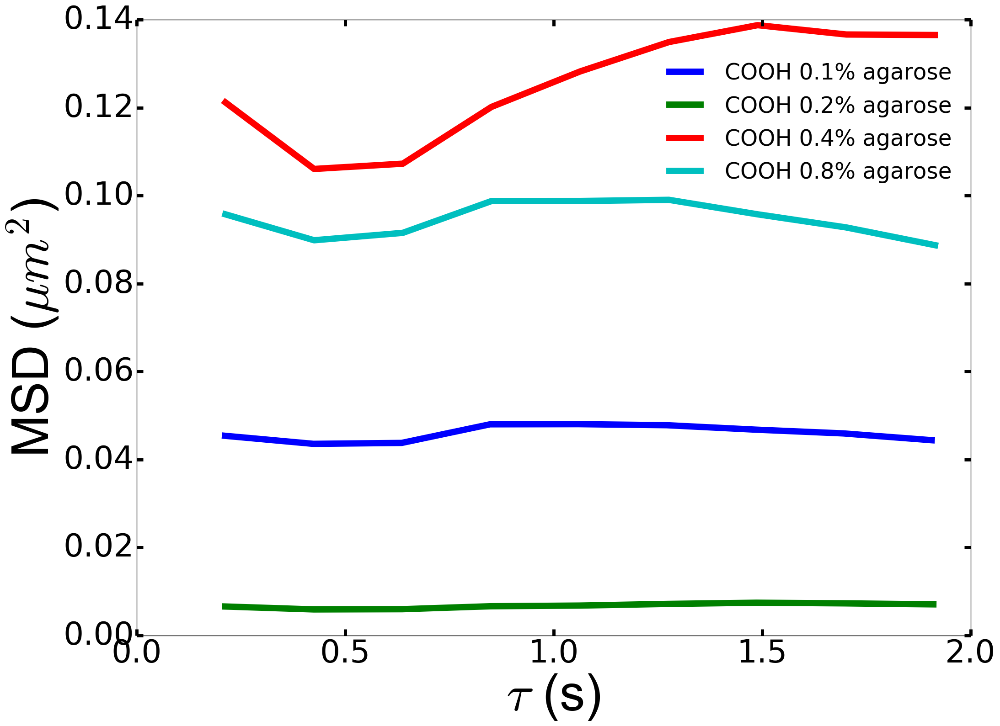

In [16]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_2[1][1:(np.ceil(2*fps_vals_2[0]))], MSD_dict_2[1][1:(np.ceil(2*fps_vals_2[0]))], linewidth=10, label = 'COOH 0.1% agarose')
ax.plot(time_dict_2[2][1:(np.ceil(2*fps_vals_2[1]))], MSD_dict_2[2][1:(np.ceil(2*fps_vals_2[1]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict_2[3][1:(np.ceil(2*fps_vals_2[2]))], MSD_dict_2[3][1:(np.ceil(2*fps_vals_2[2]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict_2[4][1:(np.ceil(2*fps_vals_2[3]))], MSD_dict_2[4][1:(np.ceil(2*fps_vals_2[3]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.legend(loc = (0.62, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.set_xlim(left=0)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.10.17 - COOH_MSDs_varying agarose conc.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


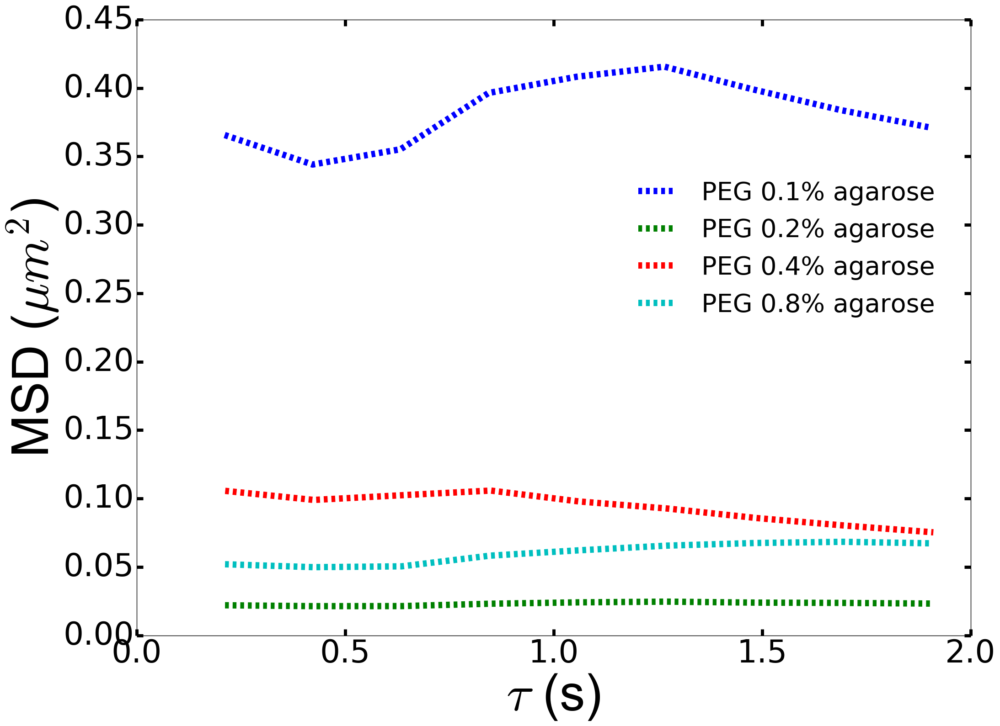

In [17]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_2[5][1:(np.ceil(2*fps_vals_2[4]))], MSD_dict_2[5][1:(np.ceil(2*fps_vals_2[4]))], linewidth=10, linestyle = '--', label = 'PEG 0.1% agarose')
ax.plot(time_dict_2[6][1:(np.ceil(2*fps_vals_2[5]))], MSD_dict_2[6][1:(np.ceil(2*fps_vals_2[5]))], linewidth=10, linestyle = '--', label = 'PEG 0.2% agarose')
ax.plot(time_dict_2[7][1:(np.ceil(2*fps_vals_2[6]))], MSD_dict_2[7][1:(np.ceil(2*fps_vals_2[6]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% agarose')
ax.plot(time_dict_2[8][1:(np.ceil(2*fps_vals_2[7]))], MSD_dict_2[8][1:(np.ceil(2*fps_vals_2[7]))], linewidth=10, linestyle = '--', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.58, 0.5),frameon=False,fontsize=40)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.set_xlim(left=0)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.10.17 - PEG_MSDs_varying agarose conc.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

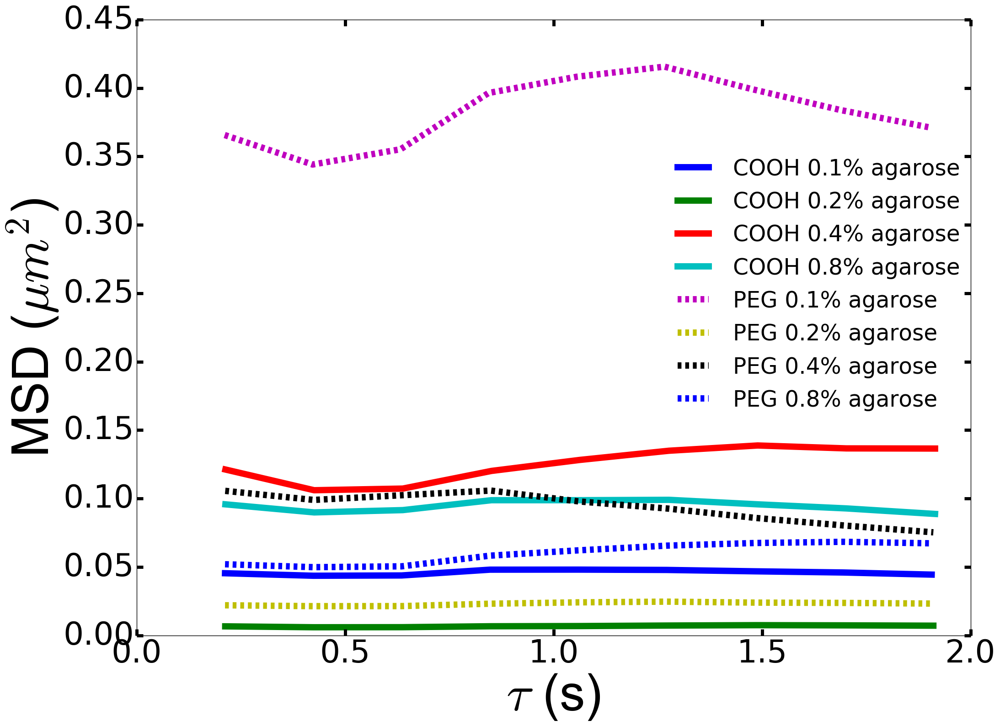

In [18]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_2[1][1:(np.ceil(2*fps_vals_2[0]))], MSD_dict_2[1][1:(np.ceil(2*fps_vals_2[0]))], linewidth=10, label = 'COOH 0.1% agarose')
ax.plot(time_dict_2[2][1:(np.ceil(2*fps_vals_2[1]))], MSD_dict_2[2][1:(np.ceil(2*fps_vals_2[1]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict_2[3][1:(np.ceil(2*fps_vals_2[2]))], MSD_dict_2[3][1:(np.ceil(2*fps_vals_2[2]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict_2[4][1:(np.ceil(2*fps_vals_2[3]))], MSD_dict_2[4][1:(np.ceil(2*fps_vals_2[3]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.plot(time_dict_2[5][1:(np.ceil(2*fps_vals_2[4]))], MSD_dict_2[5][1:(np.ceil(2*fps_vals_2[4]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.1% agarose')
ax.plot(time_dict_2[6][1:(np.ceil(2*fps_vals_2[5]))], MSD_dict_2[6][1:(np.ceil(2*fps_vals_2[5]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.2% agarose')
ax.plot(time_dict_2[7][1:(np.ceil(2*fps_vals_2[6]))], MSD_dict_2[7][1:(np.ceil(2*fps_vals_2[6]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.4% agarose')
ax.plot(time_dict_2[8][1:(np.ceil(2*fps_vals_2[7]))], MSD_dict_2[8][1:(np.ceil(2*fps_vals_2[7]))], linewidth=10, linestyle = 'dashed', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.63, 0.35),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.set_xlim(left=0)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.10.17 - MSDs_varying agarose conc.png', dpi=fig.dpi)

In [19]:
MSD_dict_3 = dict()

MSD_dict_3[1] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[2] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[3] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[4] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_COOH_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[5] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[6] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[7] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[8] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/geoM2xy_PS_PEG_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[9] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_geoM2xy_PS_COOH_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[10] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_COOH_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[11] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_8_geoM2xy_PS_COOH_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[12] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_COOH_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[13] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[14] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_COOH_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[15] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_PEG_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[16] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_PEG_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[17] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[18] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_2_geoM2xy_PS_PEG_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_3[19] = np.genfromtxt('./Data_Files_Mike/8_12_17 - MPT_100nm_PS_varying agarose concentrations/new_20_geoM2xy_PS_COOH_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')

In [20]:
print(len(MSD_dict_3[1]))
print(len(MSD_dict_3[2]))
print(len(MSD_dict_3[3]))
print(len(MSD_dict_3[4]))
print(len(MSD_dict_3[5]))
print(len(MSD_dict_3[6]))
print(len(MSD_dict_3[7]))
print(len(MSD_dict_3[8]))

285
283
283
282
284
284
284
281


In [21]:
fps_vals_3 = [4.73, 4.73, 4.74, 4.73, 4.74, 4.74, 4.74, 4.72, 4.73, 4.73, 4.73, 4.73, 4.74, 4.73, 4.74, 4.74, 4.74, 4.72, 4.73]

time_dict_3 = dict()

i = 1
while i <= len(MSD_dict_3):
    time_dict_3[i] = np.zeros(len(MSD_dict_3[i]))
    p = 0
    while p < len(time_dict_3[i]):
        time_dict_3[i][p] = p/fps_vals_3[i-1]
        p += 1
    i += 1

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


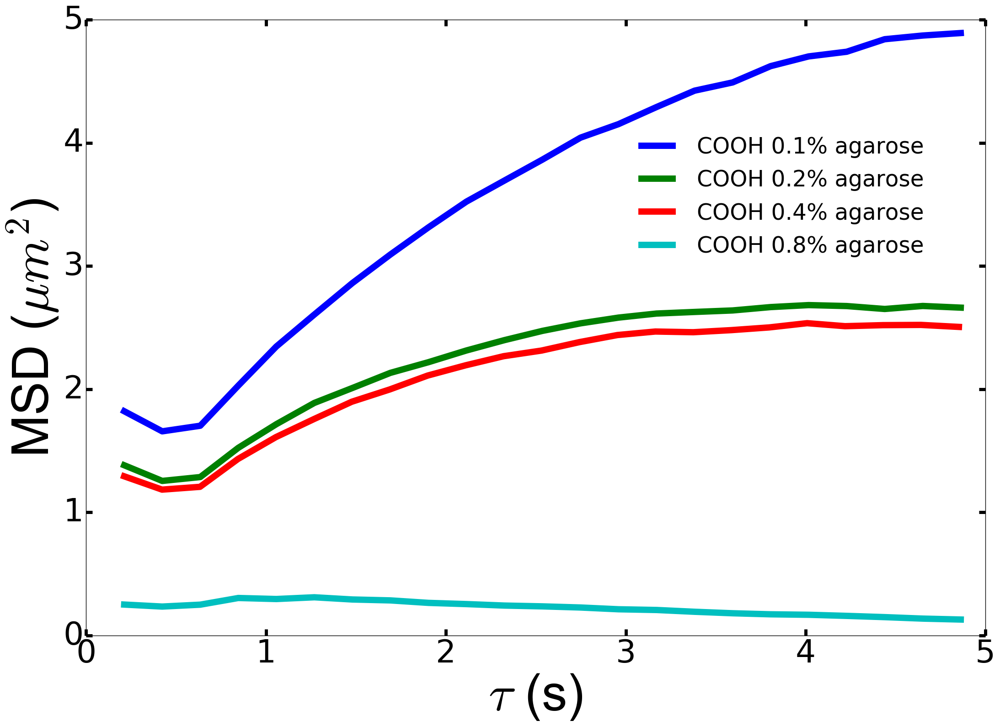

In [22]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[1][1:(np.ceil(5*fps_vals_3[0]))], MSD_dict_3[1][1:(np.ceil(5*fps_vals_3[0]))], linewidth=10, label = 'COOH 0.1% agarose')
ax.plot(time_dict_3[2][1:(np.ceil(5*fps_vals_3[1]))], MSD_dict_3[2][1:(np.ceil(5*fps_vals_3[1]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict_3[3][1:(np.ceil(5*fps_vals_3[2]))], MSD_dict_3[3][1:(np.ceil(5*fps_vals_3[2]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict_3[4][1:(np.ceil(5*fps_vals_3[3]))], MSD_dict_3[4][1:(np.ceil(5*fps_vals_3[3]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.legend(loc = (0.6, 0.6),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - COOH_MSDs_varying agarose conc.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

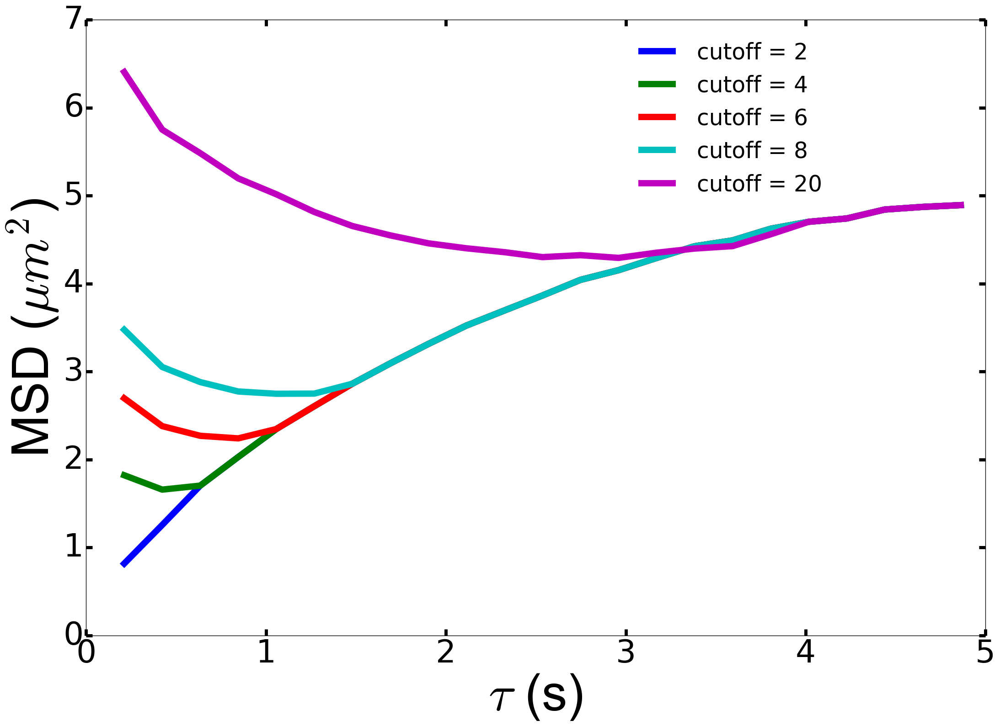

In [23]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], MSD_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], linewidth=10, label = 'cutoff = 2')
ax.plot(time_dict_3[1][1:(np.ceil(5*fps_vals_3[0]))], MSD_dict_3[1][1:(np.ceil(5*fps_vals_3[0]))], linewidth=10, label = 'cutoff = 4')
ax.plot(time_dict_3[9][1:(np.ceil(5*fps_vals_3[8]))], MSD_dict_3[9][1:(np.ceil(5*fps_vals_3[8]))], linewidth=10, label = 'cutoff = 6')
ax.plot(time_dict_3[11][1:(np.ceil(5*fps_vals_3[10]))], MSD_dict_3[11][1:(np.ceil(5*fps_vals_3[10]))], linewidth=10, label = 'cutoff = 8')
ax.plot(time_dict_3[19][1:(np.ceil(5*fps_vals_3[10]))], MSD_dict_3[19][1:(np.ceil(5*fps_vals_3[10]))], linewidth=10, label = 'cutoff = 20')
ax.legend(loc = (0.6, 0.7),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - COOH_MSDs_cutoff dependence.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


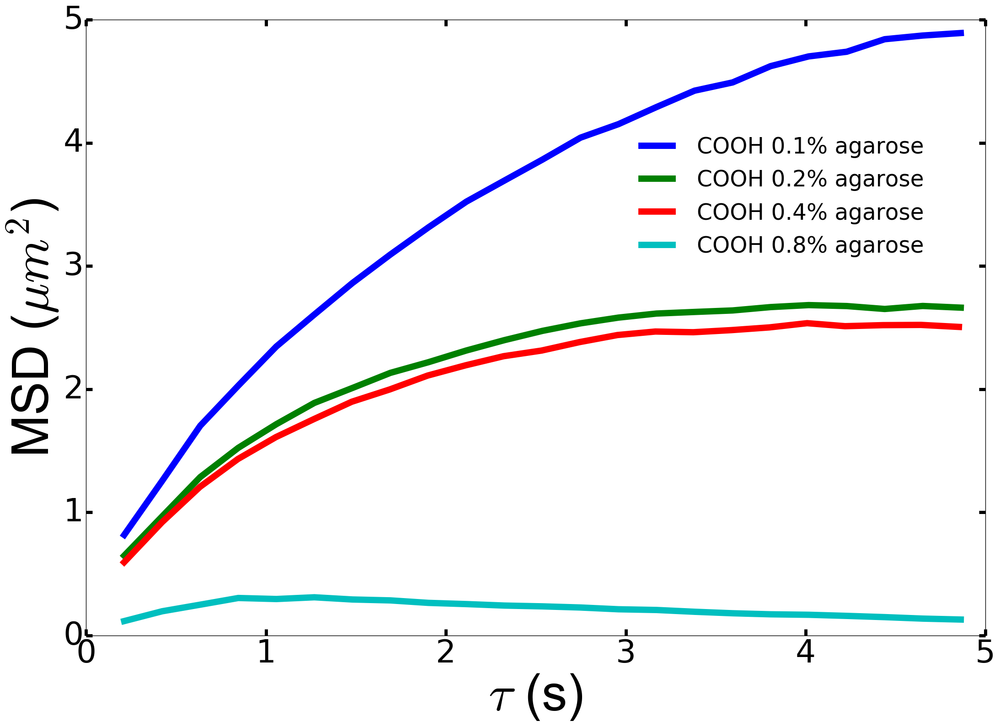

In [24]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], MSD_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], linewidth=10, label = 'COOH 0.1% agarose')
ax.plot(time_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], MSD_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], MSD_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict_3[14][1:(np.ceil(5*fps_vals_3[13]))], MSD_dict_3[14][1:(np.ceil(5*fps_vals_3[13]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.legend(loc = (0.6, 0.6),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - COOH_MSDs_varying agarose conc_new cutoff.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


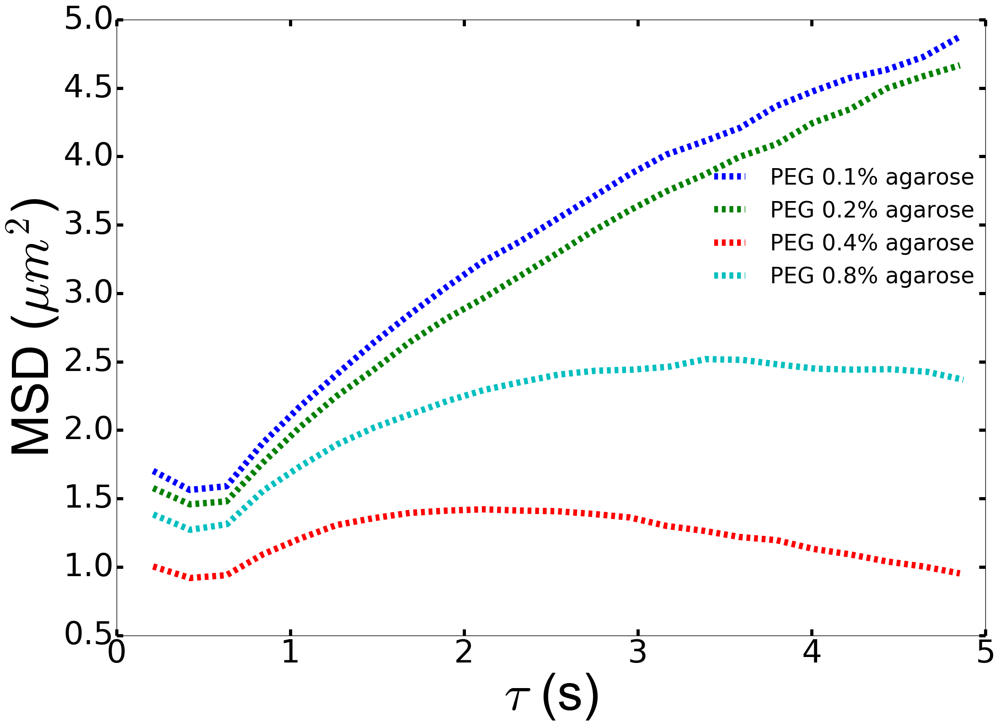

In [25]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[5][1:(np.ceil(5*fps_vals_3[4]))], MSD_dict_3[5][1:(np.ceil(5*fps_vals_3[4]))], linewidth=10, linestyle = '--', label = 'PEG 0.1% agarose')
ax.plot(time_dict_3[6][1:(np.ceil(5*fps_vals_3[5]))], MSD_dict_3[6][1:(np.ceil(5*fps_vals_3[5]))], linewidth=10, linestyle = '--', label = 'PEG 0.2% agarose')
ax.plot(time_dict_3[7][1:(np.ceil(5*fps_vals_3[6]))], MSD_dict_3[7][1:(np.ceil(5*fps_vals_3[6]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% agarose')
ax.plot(time_dict_3[8][1:(np.ceil(5*fps_vals_3[7]))], MSD_dict_3[8][1:(np.ceil(5*fps_vals_3[7]))], linewidth=10, linestyle = '--', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.67, 0.55),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - PEG_MSDs_varying agarose conc.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


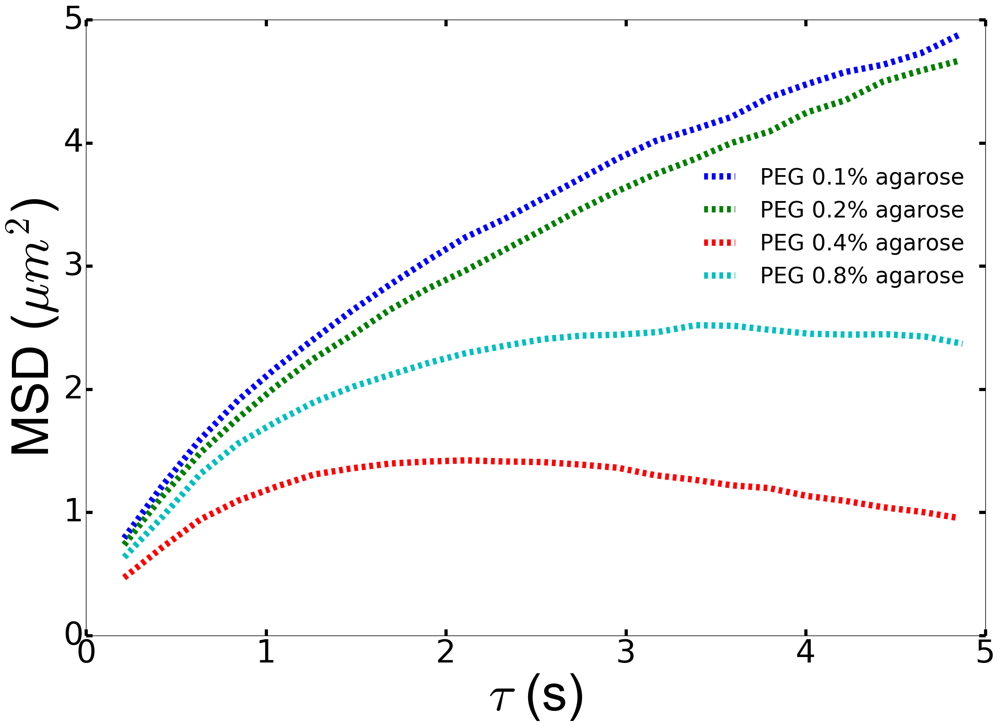

In [26]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[15][1:(np.ceil(5*fps_vals_3[14]))], MSD_dict_3[15][1:(np.ceil(5*fps_vals_3[14]))], linewidth=10, linestyle = '--', label = 'PEG 0.1% agarose')
ax.plot(time_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], MSD_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], linewidth=10, linestyle = '--', label = 'PEG 0.2% agarose')
ax.plot(time_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], MSD_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% agarose')
ax.plot(time_dict_3[18][1:(np.ceil(5*fps_vals_3[17]))], MSD_dict_3[18][1:(np.ceil(5*fps_vals_3[17]))], linewidth=10, linestyle = '--', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.67, 0.55),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - PEG_MSDs_varying agarose conc_new cutoff.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

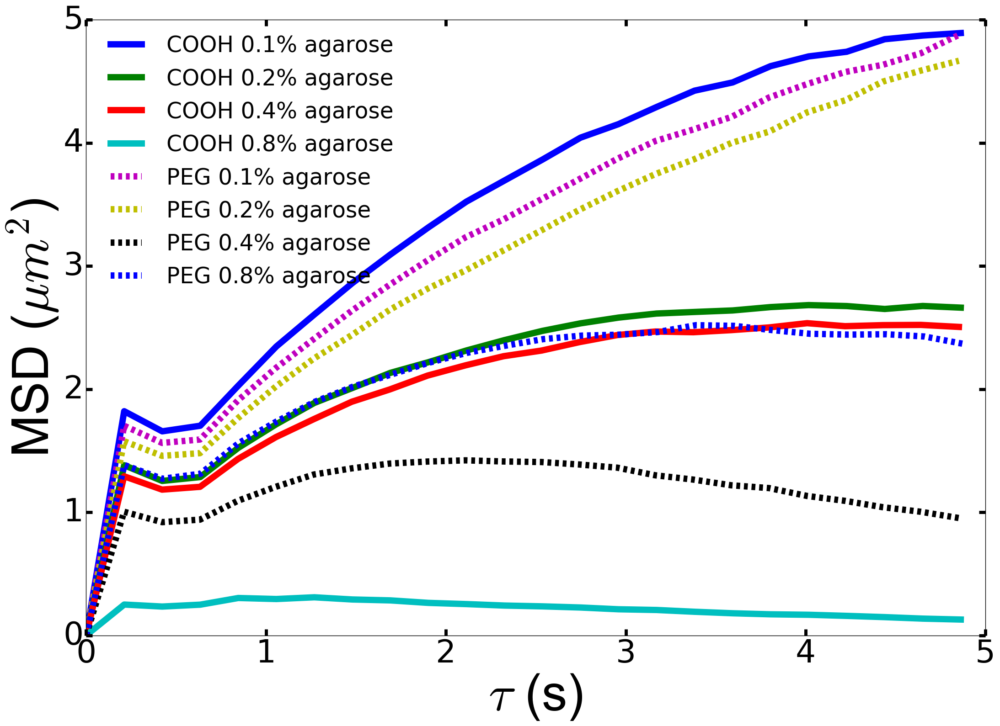

In [27]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[1][0:(np.ceil(5*fps_vals_3[0]))], MSD_dict_3[1][0:(np.ceil(5*fps_vals_3[0]))], linewidth=10, label = 'COOH 0.1% agarose')
ax.plot(time_dict_3[2][0:(np.ceil(5*fps_vals_3[1]))], MSD_dict_3[2][0:(np.ceil(5*fps_vals_3[1]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict_3[3][0:(np.ceil(5*fps_vals_3[2]))], MSD_dict_3[3][0:(np.ceil(5*fps_vals_3[2]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict_3[4][0:(np.ceil(5*fps_vals_3[3]))], MSD_dict_3[4][0:(np.ceil(5*fps_vals_3[3]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.plot(time_dict_3[5][0:(np.ceil(5*fps_vals_3[4]))], MSD_dict_3[5][0:(np.ceil(5*fps_vals_3[4]))], linewidth=10, linestyle = '--', label = 'PEG 0.1% agarose')
ax.plot(time_dict_3[6][0:(np.ceil(5*fps_vals_3[5]))], MSD_dict_3[6][0:(np.ceil(5*fps_vals_3[5]))], linewidth=10, linestyle = '--', label = 'PEG 0.2% agarose')
ax.plot(time_dict_3[7][0:(np.ceil(5*fps_vals_3[6]))], MSD_dict_3[7][0:(np.ceil(5*fps_vals_3[6]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% agarose')
ax.plot(time_dict_3[8][0:(np.ceil(5*fps_vals_3[7]))], MSD_dict_3[8][0:(np.ceil(5*fps_vals_3[7]))], linewidth=10, linestyle = '--', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.01, 0.55),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - MSDs_varying agarose conc.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

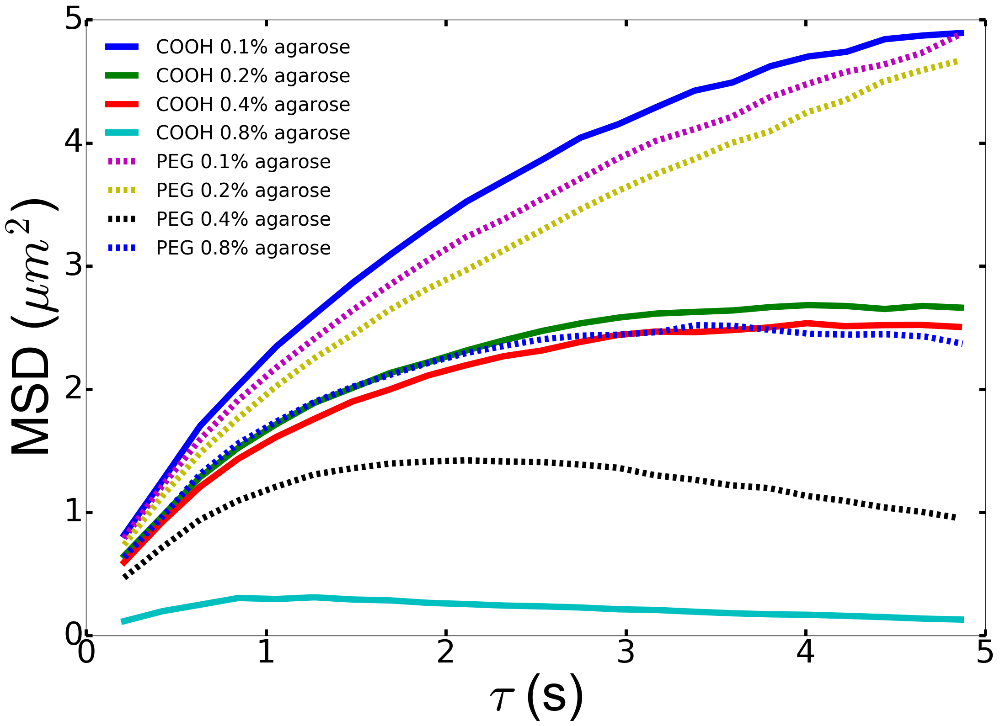

In [28]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], MSD_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], linewidth=10, label = 'COOH 0.1% agarose')
ax.plot(time_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], MSD_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], MSD_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict_3[14][1:(np.ceil(5*fps_vals_3[13]))], MSD_dict_3[14][1:(np.ceil(5*fps_vals_3[13]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.plot(time_dict_3[15][1:(np.ceil(5*fps_vals_3[14]))], MSD_dict_3[15][1:(np.ceil(5*fps_vals_3[14]))], linewidth=10, linestyle = '--', label = 'PEG 0.1% agarose')
ax.plot(time_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], MSD_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], linewidth=10, linestyle = '--', label = 'PEG 0.2% agarose')
ax.plot(time_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], MSD_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% agarose')
ax.plot(time_dict_3[18][1:(np.ceil(5*fps_vals_3[17]))], MSD_dict_3[18][1:(np.ceil(5*fps_vals_3[17]))], linewidth=10, linestyle = '--', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.01, 0.6),frameon=False,fontsize=30)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - MSDs_varying agarose conc_new cutoff.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

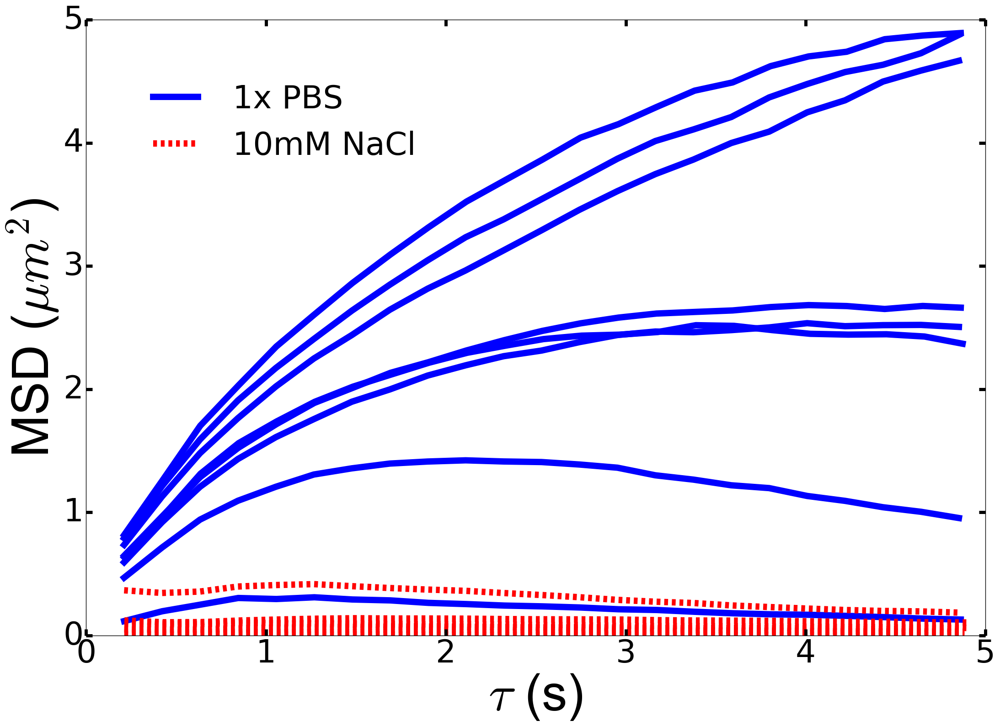

In [29]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], MSD_dict_3[10][1:(np.ceil(5*fps_vals_3[9]))], linewidth=10, color = 'blue', label = '1x PBS')
ax.plot(time_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], MSD_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], linewidth=10, color = 'blue')
ax.plot(time_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], MSD_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], linewidth=10, color = 'blue')
ax.plot(time_dict_3[14][1:(np.ceil(5*fps_vals_3[13]))], MSD_dict_3[14][1:(np.ceil(5*fps_vals_3[13]))], linewidth=10, color = 'blue')
ax.plot(time_dict_3[15][1:(np.ceil(5*fps_vals_3[14]))], MSD_dict_3[15][1:(np.ceil(5*fps_vals_3[14]))], linewidth=10, color = 'blue')
ax.plot(time_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], MSD_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], linewidth=10, color = 'blue')
ax.plot(time_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], MSD_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], linewidth=10, color = 'blue')
ax.plot(time_dict_3[18][1:(np.ceil(5*fps_vals_3[17]))], MSD_dict_3[18][1:(np.ceil(5*fps_vals_3[17]))], linewidth=10, color = 'blue')
ax.plot(time_dict_2[1][1:(np.ceil(5*fps_vals_2[0]))], MSD_dict_2[1][1:(np.ceil(5*fps_vals_2[0]))], linewidth=10, linestyle = '--', color = 'red', label = '10mM NaCl')
ax.plot(time_dict_2[2][1:(np.ceil(5*fps_vals_2[1]))], MSD_dict_2[2][1:(np.ceil(5*fps_vals_2[1]))], linewidth=10, linestyle = '--', color = 'red')
ax.plot(time_dict_2[3][1:(np.ceil(5*fps_vals_2[2]))], MSD_dict_2[3][1:(np.ceil(5*fps_vals_2[2]))], linewidth=10, linestyle = '--', color = 'red')
ax.plot(time_dict_2[4][1:(np.ceil(5*fps_vals_2[3]))], MSD_dict_2[4][1:(np.ceil(5*fps_vals_2[3]))], linewidth=10, linestyle = '--', color = 'red')
ax.plot(time_dict_2[5][1:(np.ceil(5*fps_vals_2[4]))], MSD_dict_2[5][1:(np.ceil(5*fps_vals_2[4]))], linewidth=10, linestyle = 'dashed', color = 'red')
ax.plot(time_dict_2[6][1:(np.ceil(5*fps_vals_2[5]))], MSD_dict_2[6][1:(np.ceil(5*fps_vals_2[5]))], linewidth=10, linestyle = 'dashed', color = 'red')
ax.plot(time_dict_2[7][1:(np.ceil(5*fps_vals_2[6]))], MSD_dict_2[7][1:(np.ceil(5*fps_vals_2[6]))], linewidth=10, linestyle = 'dashed', color = 'red')
ax.plot(time_dict_2[8][1:(np.ceil(5*fps_vals_2[7]))], MSD_dict_2[8][1:(np.ceil(5*fps_vals_2[7]))], linewidth=10, linestyle = 'dashed', color = 'red')
ax.legend(loc = (0.05, 0.75),frameon=False,fontsize=50)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.12.17 - 10mM NaCl vs 1xPBS_MSDs_new cutoff.png', dpi=fig.dpi)

In [30]:
MSD_dict_4 = dict()

MSD_dict_4[1] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_1/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[2] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_3/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[3] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_5/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[4] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_7/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[5] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_2/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[6] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_4/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[7] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_6/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[8] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_8/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[9] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_1/new_2_geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[10] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_3/new_2_geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[11] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_5/new_2_geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[12] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_7/new_2_geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[13] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_2/new_2_geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[14] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_4/new_2_geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[15] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_6/new_2_geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_4[16] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in_0_4_agarose gel/well_8/new_2_geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')

In [31]:
print(len(MSD_dict_4[1]))
print(len(MSD_dict_4[2]))
print(len(MSD_dict_4[3]))
print(len(MSD_dict_4[4]))
print(len(MSD_dict_4[5]))
print(len(MSD_dict_4[6]))
print(len(MSD_dict_4[7]))
print(len(MSD_dict_4[8]))

480
480
480
480
480
480
480
480


In [32]:
fps_vals_4 = [9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91]

time_dict_4 = dict()

i = 1
while i <= len(MSD_dict_4):
    time_dict_4[i] = np.zeros(len(MSD_dict_4[i]))
    p = 0
    while p < len(time_dict_4[i]):
        time_dict_4[i][p] = p/fps_vals_4[i-1]
        p += 1
    i += 1

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


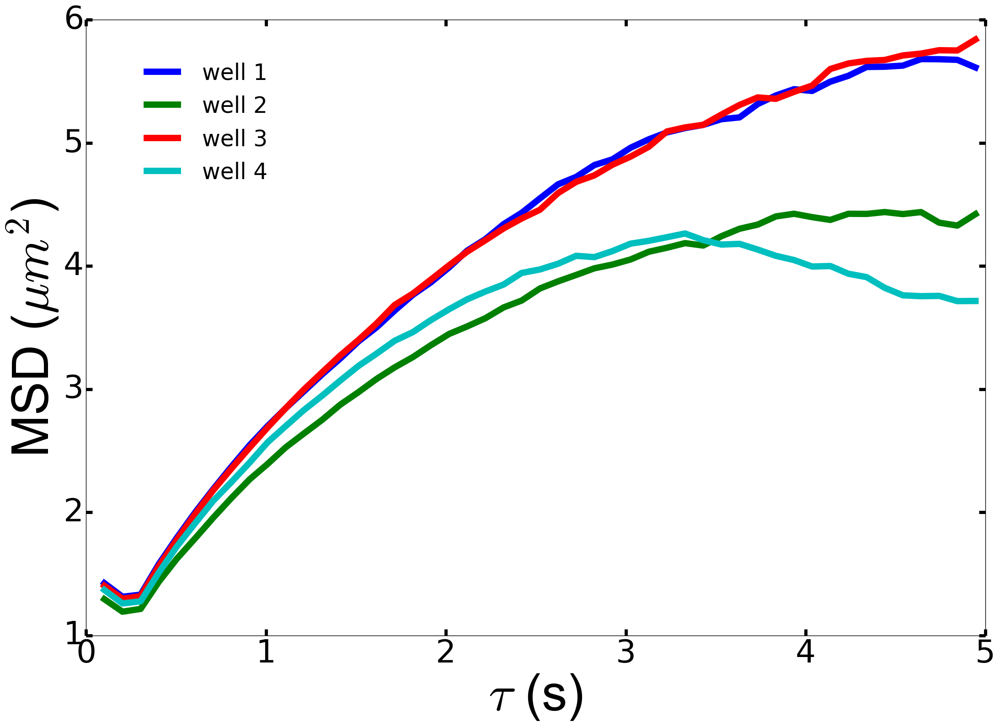

In [33]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_4[1][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[1][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'well 1')
ax.plot(time_dict_4[2][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[2][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'well 2')
ax.plot(time_dict_4[3][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[3][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'well 3')
ax.plot(time_dict_4[4][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[4][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'well 4')
ax.legend(loc = (0.05, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - COOH_MSDs_in 0_4 agarose gel.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


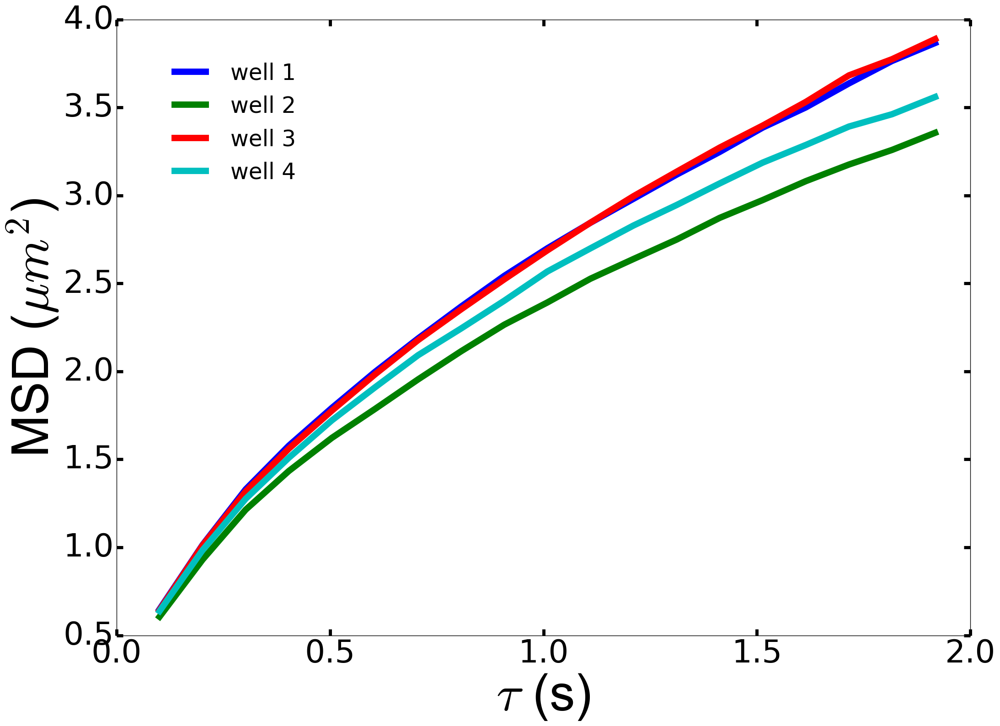

In [34]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_4[9][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[9][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'well 1')
ax.plot(time_dict_4[10][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[10][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'well 2')
ax.plot(time_dict_4[11][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[11][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'well 3')
ax.plot(time_dict_4[12][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[12][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'well 4')
ax.legend(loc = (0.05, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - COOH_MSDs_in 0_4 agarose gel_new cutoff.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


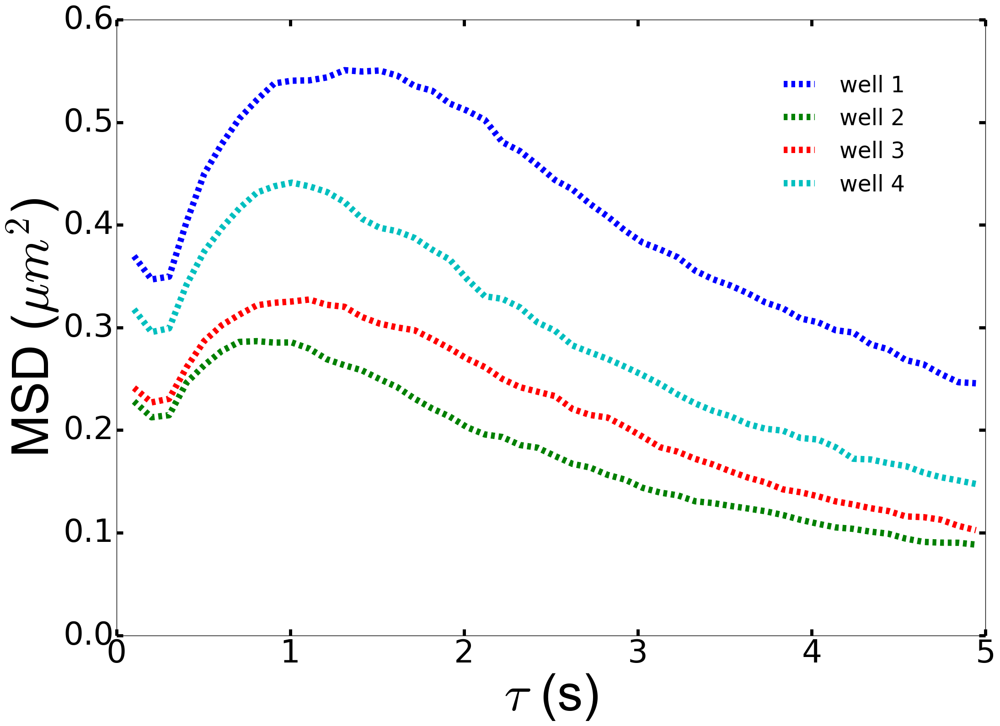

In [35]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_4[5][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[5][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 1')
ax.plot(time_dict_4[6][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[6][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 2')
ax.plot(time_dict_4[7][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[7][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 3')
ax.plot(time_dict_4[8][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[8][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 4')
ax.legend(loc = (0.75, 0.7),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - PEG_MSDs_in 0_4 agarose gel.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


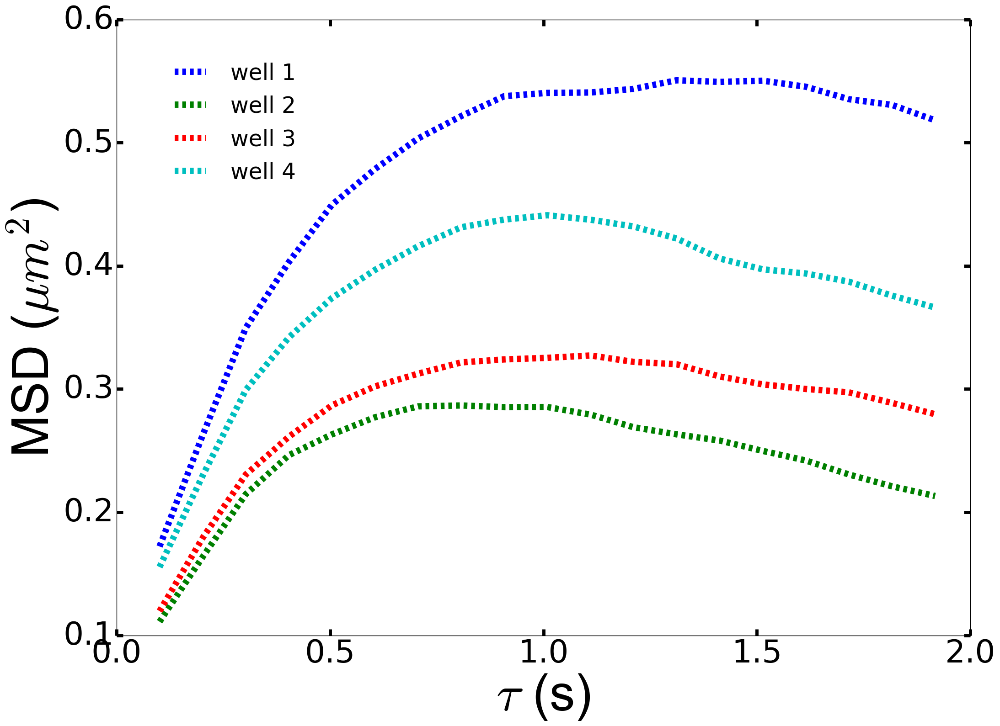

In [36]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_4[13][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[13][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 1')
ax.plot(time_dict_4[14][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[14][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 2')
ax.plot(time_dict_4[15][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[15][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 3')
ax.plot(time_dict_4[16][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[16][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'well 4')
ax.legend(loc = (0.05, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - PEG_MSDs_in 0_4 agarose gel_new cutoff.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

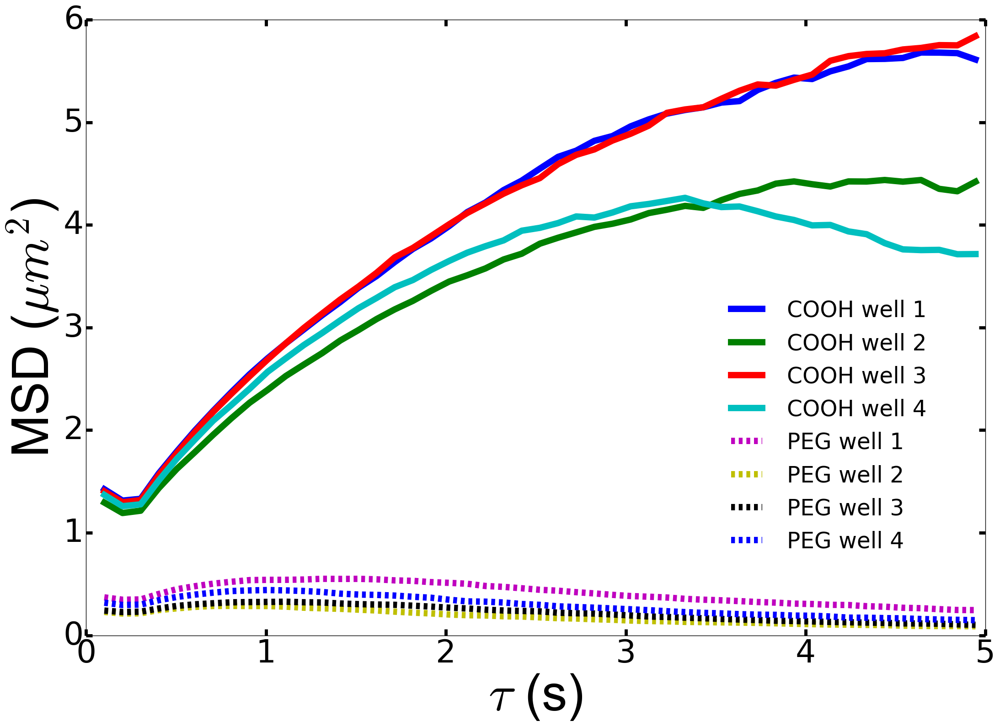

In [37]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_4[1][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[1][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'COOH well 1')
ax.plot(time_dict_4[2][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[2][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'COOH well 2')
ax.plot(time_dict_4[3][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[3][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'COOH well 3')
ax.plot(time_dict_4[4][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[4][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'COOH well 4')
ax.plot(time_dict_4[5][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[5][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 1')
ax.plot(time_dict_4[6][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[6][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 2')
ax.plot(time_dict_4[7][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[7][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 3')
ax.plot(time_dict_4[8][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[8][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 4')
ax.legend(loc = (0.7, 0.12),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - COOH_MSDs_in 0_4 agarose gel.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

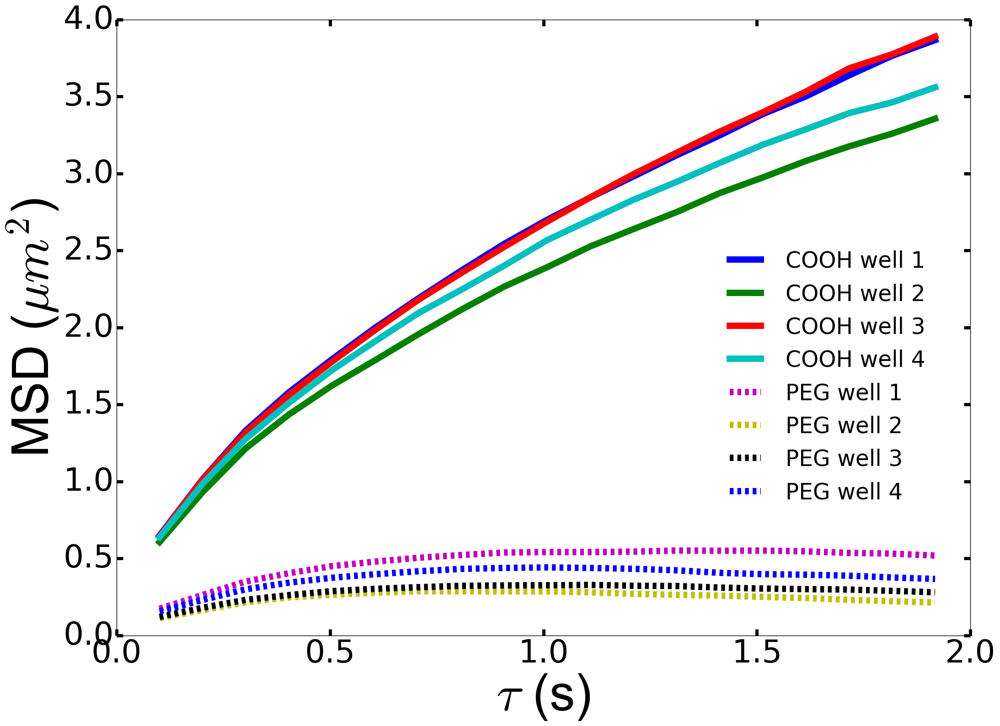

In [38]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_4[9][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[9][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'COOH well 1')
ax.plot(time_dict_4[10][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[10][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'COOH well 2')
ax.plot(time_dict_4[11][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[11][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'COOH well 3')
ax.plot(time_dict_4[12][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[12][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, label = 'COOH well 4')
ax.plot(time_dict_4[13][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[13][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 1')
ax.plot(time_dict_4[14][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[14][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 2')
ax.plot(time_dict_4[15][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[15][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 3')
ax.plot(time_dict_4[16][1:(np.ceil(2*fps_vals_4[0]))], MSD_dict_4[16][1:(np.ceil(2*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = 'PEG well 4')
ax.legend(loc = (0.7, 0.2),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - MSDs_in 0_4 agarose gel.png', dpi=fig.dpi)

In [39]:
MSD_dict_5 = dict()

MSD_dict_5[1] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/geoM2xy_PS_COOH_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_5[2] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_2.csv', delimiter = ',')
MSD_dict_5[3] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/geoM2xy_PS_PEG_in_0_2_agarose_gel_vid_2.csv', delimiter = ',')
MSD_dict_5[4] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_2.csv', delimiter = ',')
MSD_dict_5[5] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/new_2_geoM2xy_PS_COOH_in_0_2_agarose_gel_vid_2.csv', delimiter = ',')
MSD_dict_5[6] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/new_2_geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_2.csv', delimiter = ',')
MSD_dict_5[7] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/new_2_geoM2xy_PS_PEG_in_0_2_agarose_gel_vid_2.csv', delimiter = ',')
MSD_dict_5[8] = np.genfromtxt('./Data_Files_Mike/8_16_17 - MPT_100nm_PS_in reused agarose gel/new_2_geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_2.csv', delimiter = ',')

In [40]:
print(len(MSD_dict_5[1]))
print(len(MSD_dict_5[2]))
print(len(MSD_dict_5[3]))
print(len(MSD_dict_5[4]))

480
480
480
480


In [41]:
fps_vals_5 = [9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91]

time_dict_5 = dict()

i = 1
while i <= len(MSD_dict_5):
    time_dict_5[i] = np.zeros(len(MSD_dict_5[i]))
    p = 0
    while p < len(time_dict_5[i]):
        time_dict_5[i][p] = p/fps_vals_5[i-1]
        p += 1
    i += 1

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


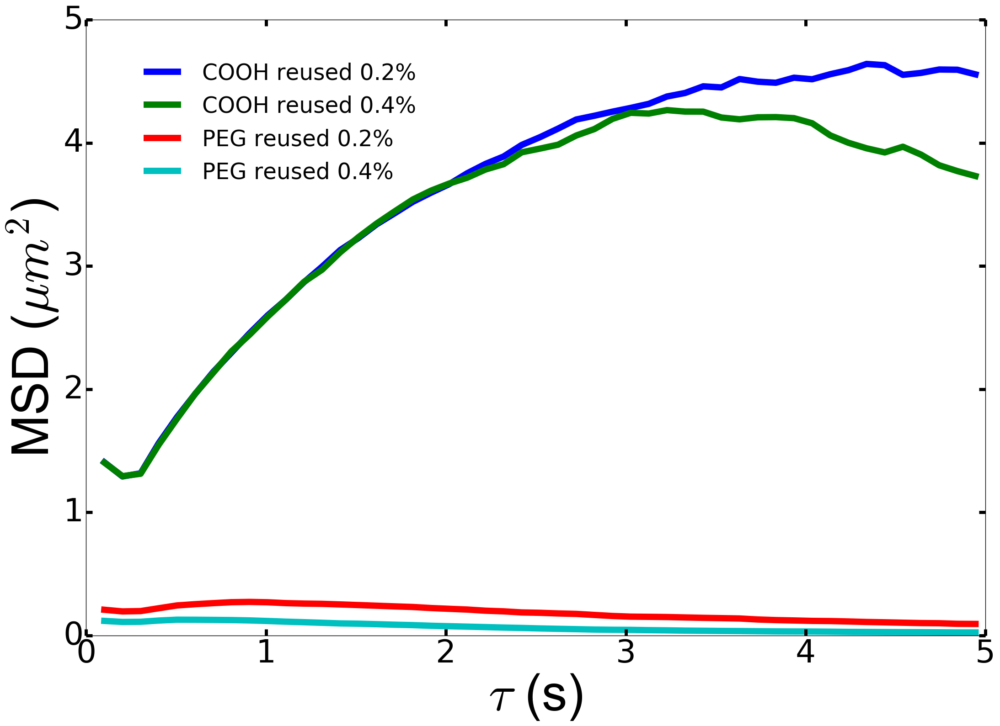

In [42]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_5[1][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_5[1][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'COOH reused 0.2%')
ax.plot(time_dict_5[2][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_5[2][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'COOH reused 0.4%')
ax.plot(time_dict_5[3][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_5[3][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'PEG reused 0.2%')
ax.plot(time_dict_5[4][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_5[4][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, label = 'PEG reused 0.4%')
ax.legend(loc = (0.05, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - MSDs_in reused agarose gel.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


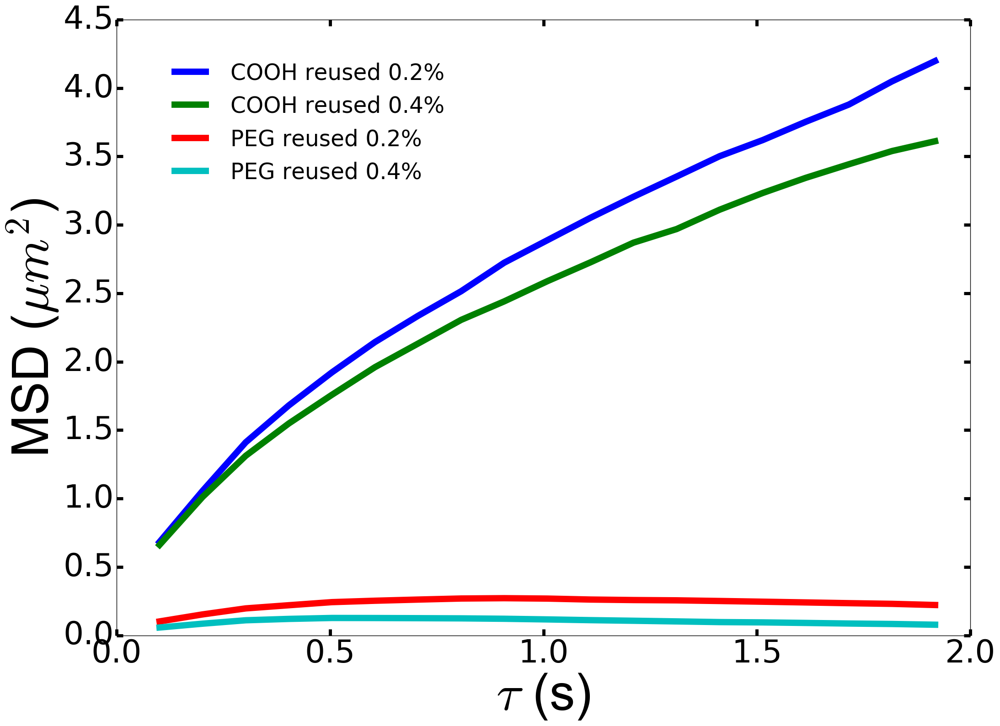

In [43]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_5[5][1:(np.ceil(2*fps_vals_5[0]))], MSD_dict_5[5][1:(np.ceil(2*fps_vals_5[0]))], linewidth=10, label = 'COOH reused 0.2%')
ax.plot(time_dict_5[6][1:(np.ceil(2*fps_vals_5[0]))], MSD_dict_5[6][1:(np.ceil(2*fps_vals_5[0]))], linewidth=10, label = 'COOH reused 0.4%')
ax.plot(time_dict_5[7][1:(np.ceil(2*fps_vals_5[0]))], MSD_dict_5[7][1:(np.ceil(2*fps_vals_5[0]))], linewidth=10, label = 'PEG reused 0.2%')
ax.plot(time_dict_5[8][1:(np.ceil(2*fps_vals_5[0]))], MSD_dict_5[8][1:(np.ceil(2*fps_vals_5[0]))], linewidth=10, label = 'PEG reused 0.4%')
ax.legend(loc = (0.05, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - MSDs_in reused agarose gel_new cutoff.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

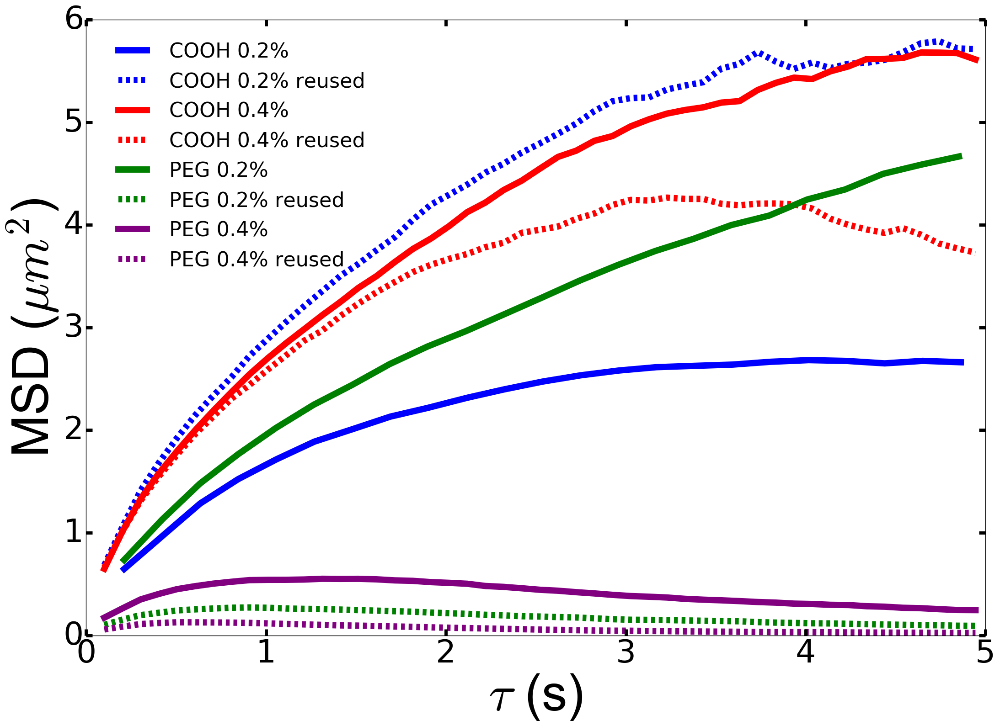

In [44]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], MSD_dict_3[12][1:(np.ceil(5*fps_vals_3[11]))], linewidth=10, color='blue', label = 'COOH 0.2%')
ax.plot(time_dict_5[5][1:(np.ceil(5*fps_vals_5[0]))], MSD_dict_5[5][1:(np.ceil(5*fps_vals_5[0]))], linewidth=10, color='blue', linestyle = '--', label = 'COOH 0.2% reused')
ax.plot(time_dict_4[9][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[9][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color='red', label = 'COOH 0.4%')
ax.plot(time_dict_5[6][1:(np.ceil(5*fps_vals_5[0]))], MSD_dict_5[6][1:(np.ceil(5*fps_vals_5[0]))], linewidth=10, color='red', linestyle = '--',  label = 'COOH 0.4% reused')
ax.plot(time_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], MSD_dict_3[16][1:(np.ceil(5*fps_vals_3[15]))], linewidth=10, color='green', label = 'PEG 0.2%')
ax.plot(time_dict_5[7][1:(np.ceil(5*fps_vals_5[0]))], MSD_dict_5[7][1:(np.ceil(5*fps_vals_5[0]))], linewidth=10, color='green', linestyle = '--', label = 'PEG 0.2% reused')
ax.plot(time_dict_4[13][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[13][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color='purple', label = 'PEG 0.4%')
ax.plot(time_dict_5[8][1:(np.ceil(5*fps_vals_5[0]))], MSD_dict_5[8][1:(np.ceil(5*fps_vals_5[0]))], linewidth=10, color='purple', linestyle = '--', label = 'PEG 0.4% reused')
ax.legend(loc = (0.02, 0.58),frameon=False,fontsize=32)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8.16.17 - MSDs - reused vs original agarose gel_new cutoff.png', dpi=fig.dpi)

In [45]:
MSD_dict_6 = dict()

MSD_dict_6[1] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_1/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_6[2] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_3/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_6[3] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_2/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_6[4] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_4/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_6[5] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_5/geoM2xy_PS_COOH_in_0_4_agarose_gel_HA_vid_1.csv', delimiter = ',')
MSD_dict_6[6] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_7/geoM2xy_PS_COOH_in_0_4_agarose_gel_HA_vid_1.csv', delimiter = ',')
MSD_dict_6[7] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_6/geoM2xy_PS_PEG_in_0_4_agarose_gel_HA_vid_1.csv', delimiter = ',')
MSD_dict_6[8] = np.genfromtxt('./Data_Files_Mike/8_28_17 - MPT_100nm_PS_in_HA_agarose gel/well_8/geoM2xy_PS_PEG_in_0_4_agarose_gel_HA_vid_1.csv', delimiter = ',')

In [46]:
fps_vals_6 = [9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91]

time_dict_6 = dict()

i = 1
while i <= len(MSD_dict_6):
    time_dict_6[i] = np.zeros(len(MSD_dict_6[i]))
    p = 0
    while p < len(time_dict_6[i]):
        time_dict_6[i][p] = p/fps_vals_6[i-1]
        p += 1
    i += 1

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


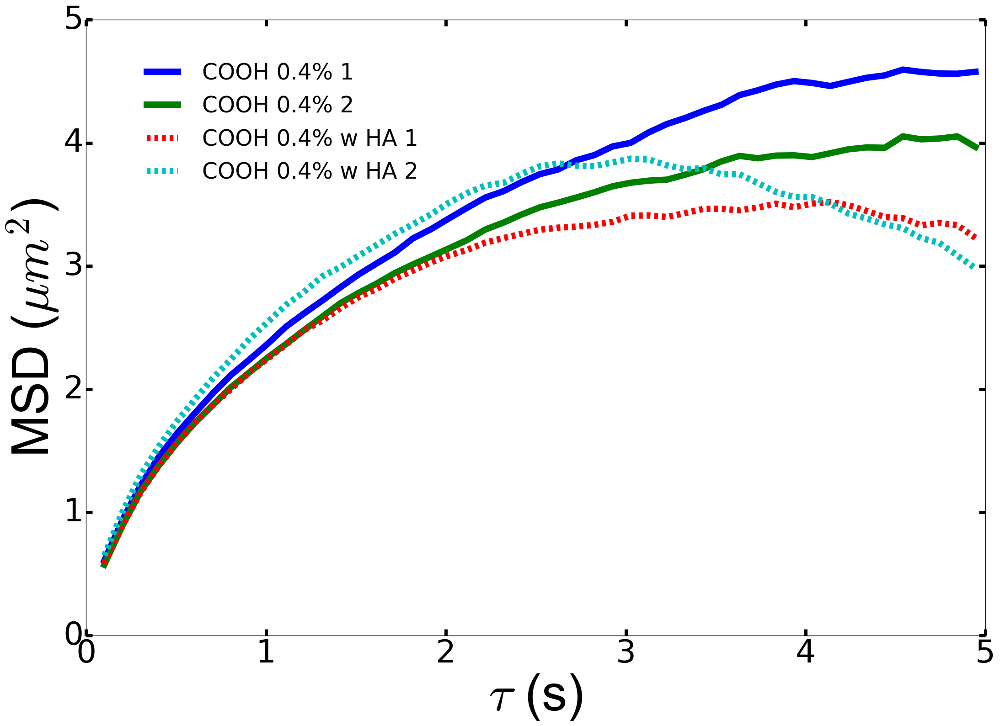

In [47]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_6[1][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[1][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, label = 'COOH 0.4% 1')
ax.plot(time_dict_6[2][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[2][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, label = 'COOH 0.4% 2')
ax.plot(time_dict_6[5][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[5][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', label = 'COOH 0.4% w HA 1')
ax.plot(time_dict_6[6][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[6][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', label = 'COOH 0.4% w HA 2')
ax.legend(loc = (0.05, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.set_ylim(bottom=0)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8_28_17 - COOH MSDs HA effect.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


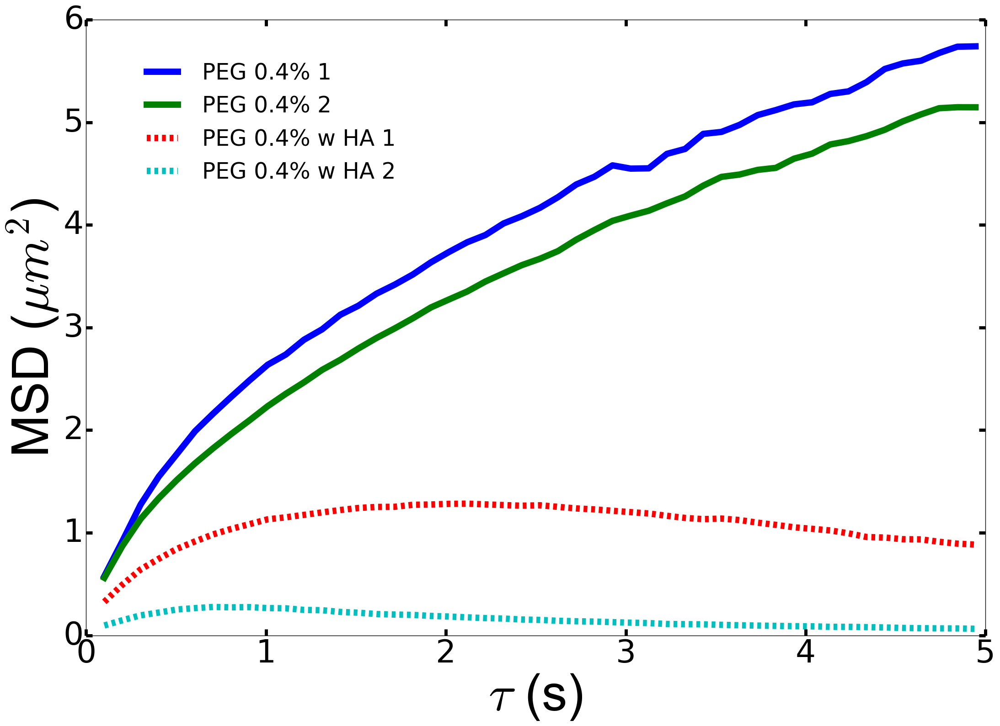

In [48]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, label = 'PEG 0.4% 1')
ax.plot(time_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, label = 'PEG 0.4% 2')
ax.plot(time_dict_6[7][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[7][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% w HA 1')
ax.plot(time_dict_6[8][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[8][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% w HA 2')
ax.legend(loc = (0.05, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('8_28_17 - PEG MSDs HA effect.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

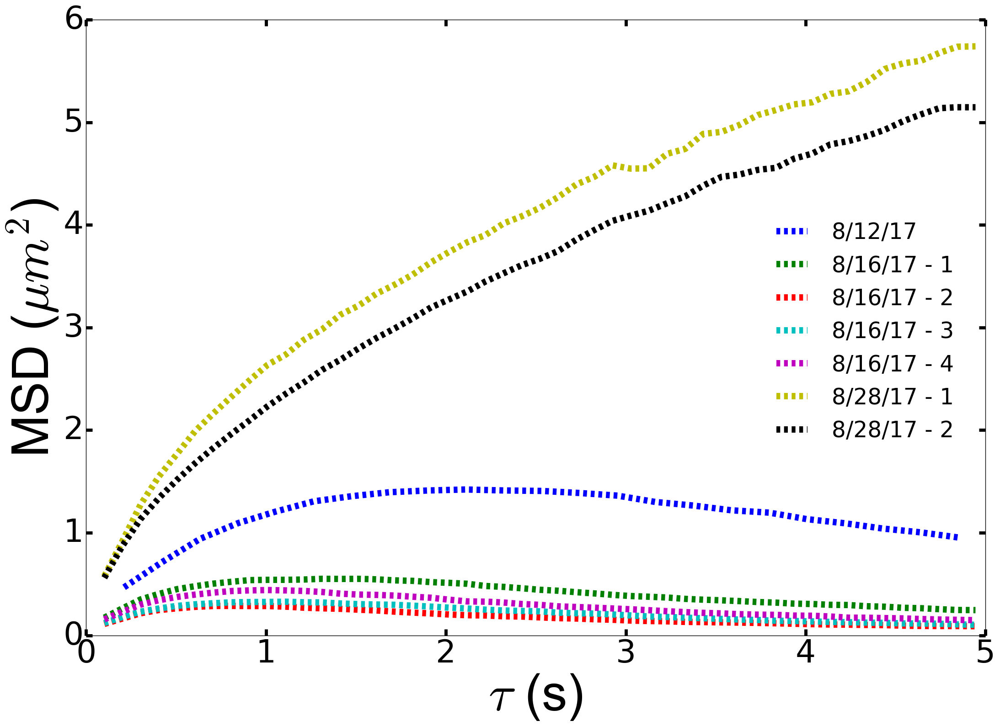

In [49]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], MSD_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], linewidth=10, linestyle = '--', label = '8/12/17')
ax.plot(time_dict_4[13][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[13][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = '8/16/17 - 1')
ax.plot(time_dict_4[14][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[14][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = '8/16/17 - 2')
ax.plot(time_dict_4[15][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[15][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = '8/16/17 - 3')
ax.plot(time_dict_4[16][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[16][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', label = '8/16/17 - 4')
ax.plot(time_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', label = '8/28/17 - 1')
ax.plot(time_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', label = '8/28/17 - 2')
ax.legend(loc = (0.75, 0.3),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('Inconsistencies with PEG MSDs.png', dpi=fig.dpi)

In [50]:
MSD_dict_7 = dict()

MSD_dict_7[1] = np.genfromtxt('./Data_Files_Mike/8_30_17 - MPT in brain sections/PS_COOH/geoM2xy_green_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_7[2] = np.genfromtxt('./Data_Files_Mike/8_30_17 - MPT in brain sections/PS_PEG/geoM2xy_green_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')

In [51]:
print(len(MSD_dict_7[1]))
print(len(MSD_dict_7[2]))

479
479


In [52]:
fps_vals_7 = [5, 5]

time_dict_7 = dict()

i = 1
while i <= len(MSD_dict_7):
    time_dict_7[i] = np.zeros(len(MSD_dict_7[i]))
    p = 0
    while p < len(time_dict_7[i]):
        time_dict_7[i][p] = p/fps_vals_7[i-1]
        p += 1
    i += 1

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


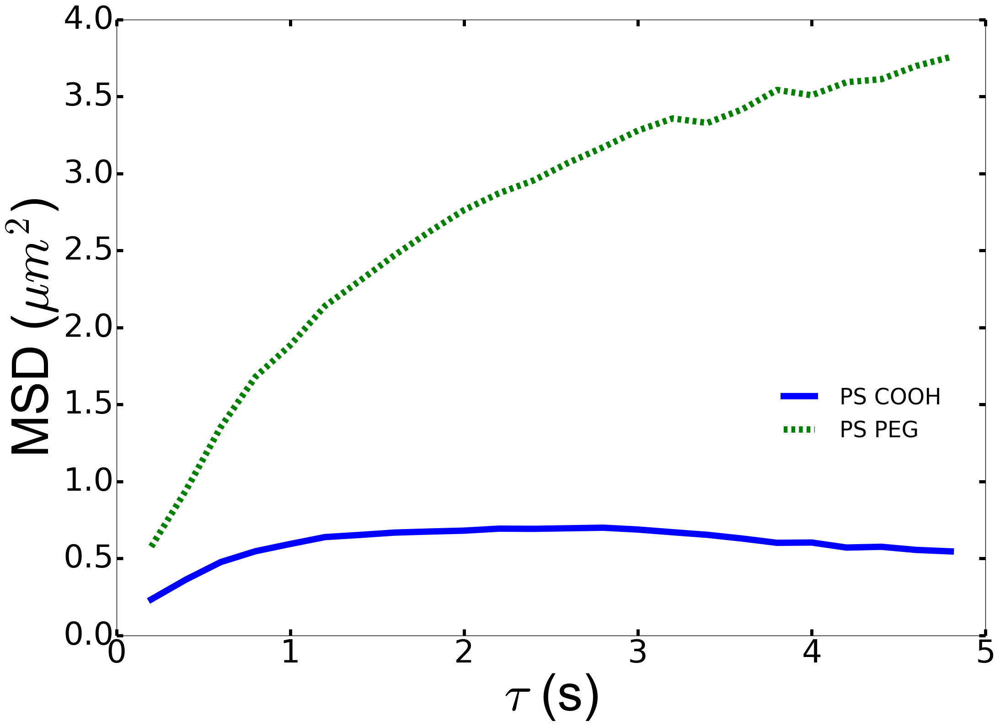

In [53]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_7[1][1:(np.ceil(5*fps_vals_7[0]))], MSD_dict_7[1][1:(np.ceil(5*fps_vals_7[0]))], linewidth=10, label = 'PS COOH')
ax.plot(time_dict_7[2][1:(np.ceil(5*fps_vals_7[1]))], MSD_dict_7[2][1:(np.ceil(5*fps_vals_7[1]))], linewidth=10, linestyle = '--', label = 'PS PEG')
ax.legend(loc = (0.75, 0.3),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('MPT in brain tissue.png', dpi=fig.dpi)

In [54]:
MSD_dict_8 = dict()

MSD_dict_8[1] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_1/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_8[2] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_3/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_8[3] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_5/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_8[4] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_7/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_8[5] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_2/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_8[6] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_4/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_8[7] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_6/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_8[8] = np.genfromtxt('./Data_Files_Mike/9_3_17 - MPT varying HA conc/well_8/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')

In [55]:
fps_vals_8 = [9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91, 9.91]

time_dict_8 = dict()

i = 1
while i <= len(MSD_dict_8):
    time_dict_8[i] = np.zeros(len(MSD_dict_8[i]))
    p = 0
    while p < len(time_dict_8[i]):
        time_dict_8[i][p] = p/fps_vals_8[i-1]
        p += 1
    i += 1

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


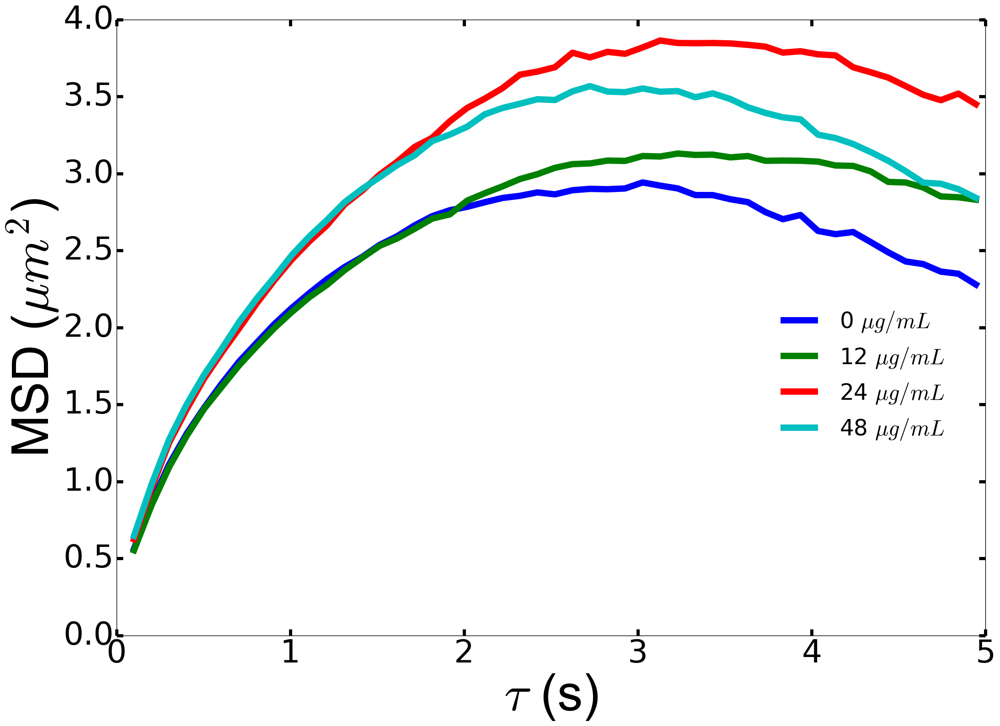

In [56]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_8[1][1:(np.ceil(5*fps_vals_8[0]))], MSD_dict_8[1][1:(np.ceil(5*fps_vals_8[0]))], linewidth=10, label = r'0 $\mu g/mL$')
ax.plot(time_dict_8[2][1:(np.ceil(5*fps_vals_8[1]))], MSD_dict_8[2][1:(np.ceil(5*fps_vals_8[1]))], linewidth=10, label = r'12 $\mu g/mL$')
ax.plot(time_dict_8[3][1:(np.ceil(5*fps_vals_8[2]))], MSD_dict_8[3][1:(np.ceil(5*fps_vals_8[2]))], linewidth=10, label = r'24 $\mu g/mL$')
ax.plot(time_dict_8[4][1:(np.ceil(5*fps_vals_8[3]))], MSD_dict_8[4][1:(np.ceil(5*fps_vals_8[3]))], linewidth=10, label = r'48 $\mu g/mL$')
ax.legend(loc = (0.75, 0.3),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.set_ylim(bottom=0)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('COOH MSDs at varying HA concentration.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


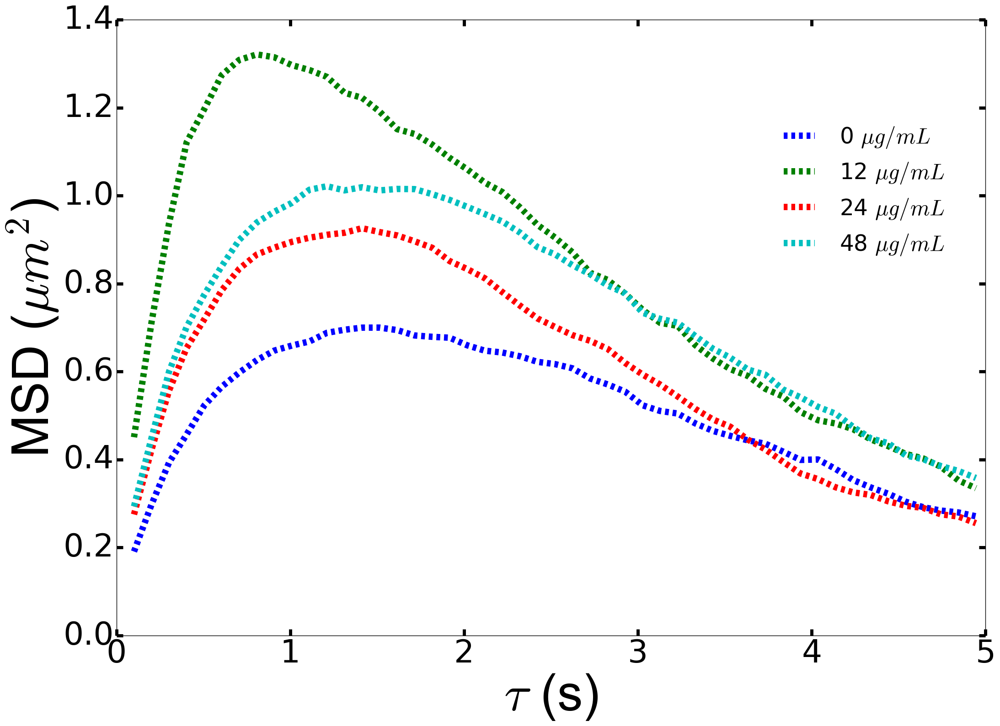

In [57]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_8[5][1:(np.ceil(5*fps_vals_8[4]))], MSD_dict_8[5][1:(np.ceil(5*fps_vals_8[4]))], linewidth=10, linestyle = '--', label = r'0 $\mu g/mL$')
ax.plot(time_dict_8[6][1:(np.ceil(5*fps_vals_8[5]))], MSD_dict_8[6][1:(np.ceil(5*fps_vals_8[5]))], linewidth=10, linestyle = '--', label = r'12 $\mu g/mL$')
ax.plot(time_dict_8[7][1:(np.ceil(5*fps_vals_8[6]))], MSD_dict_8[7][1:(np.ceil(5*fps_vals_8[6]))], linewidth=10, linestyle = '--', label = r'24 $\mu g/mL$')
ax.plot(time_dict_8[8][1:(np.ceil(5*fps_vals_8[7]))], MSD_dict_8[8][1:(np.ceil(5*fps_vals_8[7]))], linewidth=10, linestyle = '--', label = r'48 $\mu g/mL$')
ax.legend(loc = (0.75, 0.6),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('PEG MSDs at varying HA concentration.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

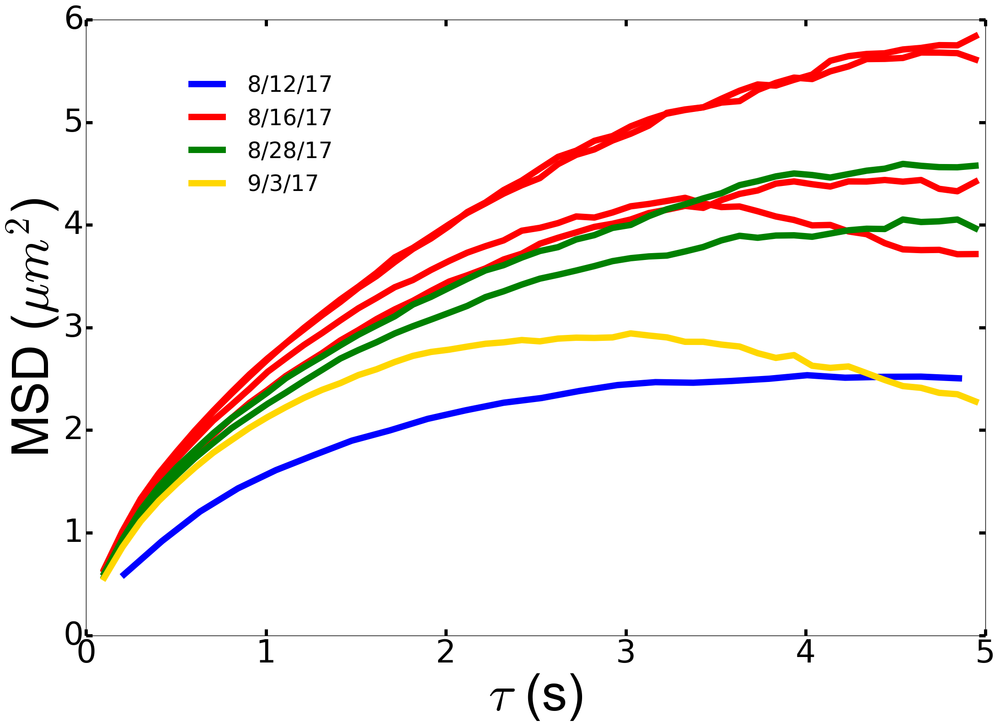

In [58]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], MSD_dict_3[13][1:(np.ceil(5*fps_vals_3[12]))], linewidth=10, color = 'blue', label = '8/12/17')
ax.plot(time_dict_4[9][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[9][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color = 'red', label = '8/16/17')
ax.plot(time_dict_4[10][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[10][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color = 'red')
ax.plot(time_dict_4[11][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[11][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color = 'red')
ax.plot(time_dict_4[12][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[12][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color = 'red')
ax.plot(time_dict_6[1][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[1][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, color = 'green', label = '8/28/17')
ax.plot(time_dict_6[2][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[2][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, color = 'green')
ax.plot(time_dict_8[1][1:(np.ceil(5*fps_vals_8[4]))], MSD_dict_8[1][1:(np.ceil(5*fps_vals_8[4]))], linewidth=10, color = 'gold', label = '9/3/17')
ax.legend(loc = (0.1, 0.7),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('reproducibility data: COOH MSDs different batches.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

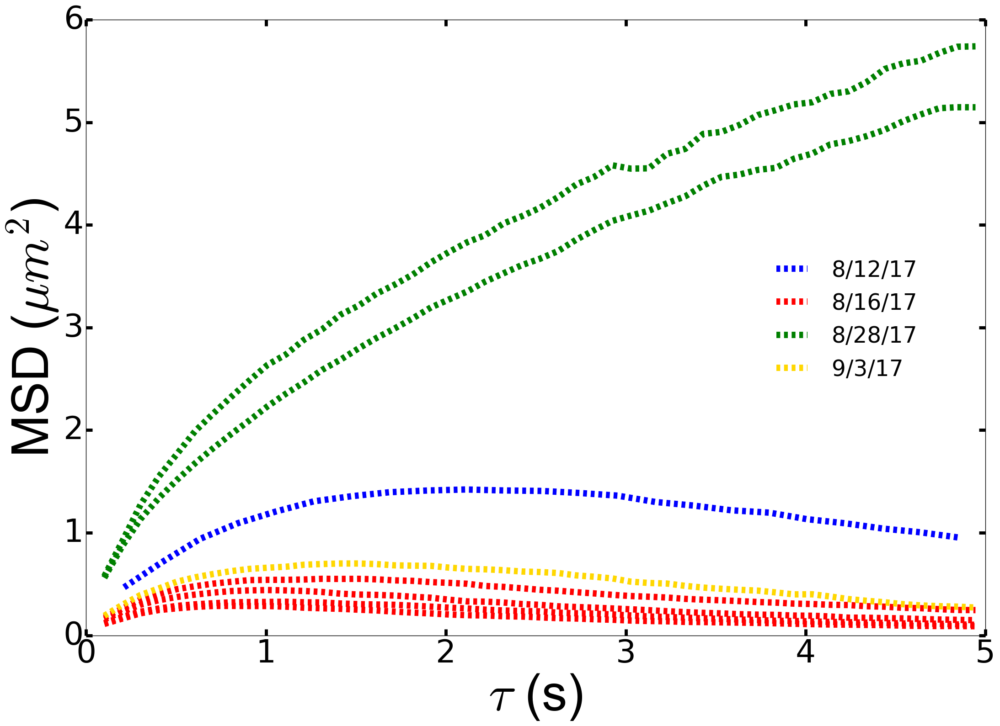

In [59]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], MSD_dict_3[17][1:(np.ceil(5*fps_vals_3[16]))], linewidth=10, linestyle = '--', color = 'blue', label = '8/12/17')
ax.plot(time_dict_4[13][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[13][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', color = 'red', label = '8/16/17')
ax.plot(time_dict_4[14][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[14][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', color = 'red')
ax.plot(time_dict_4[15][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[15][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', color = 'red')
ax.plot(time_dict_4[16][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[16][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, linestyle = '--', color = 'red')
ax.plot(time_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', color = 'green', label = '8/28/17')
ax.plot(time_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', color = 'green')
ax.plot(time_dict_8[5][1:(np.ceil(5*fps_vals_8[4]))], MSD_dict_8[5][1:(np.ceil(5*fps_vals_8[4]))], linewidth=10, linestyle = '--', color = 'gold', label = '9/3/17')
ax.legend(loc = (0.75, 0.4),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('reproducibility data: PEG MSDs different batches.png.png', dpi=fig.dpi)

In [60]:
MSD_dict_9 = dict()

MSD_dict_9[1] = np.genfromtxt('./Data_Files_Mike/9_6_17 - MPT in brain sections/PS_COOH/geoM2xy_PS_COOH_section_1_vid_1.csv', delimiter = ',')
MSD_dict_9[2] = np.genfromtxt('./Data_Files_Mike/9_6_17 - MPT in brain sections/PS_PEG/geoM2xy_PS_PEG_section_2_vid_1.csv', delimiter = ',')

In [61]:
MSD_dict_10 = dict()

MSD_dict_10[1] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_1/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_10[2] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_3/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_10[3] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_5/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_10[4] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_7/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_10[5] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_2/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_10[6] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_4/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_10[7] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_6/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_10[8] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - cold/well_8/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')

In [62]:
MSD_dict_11 = dict()

MSD_dict_11[1] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_1/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_11[2] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_3/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_11[3] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_5/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_11[4] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_7/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_11[5] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_2/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_11[6] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_4/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_11[7] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_6/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_11[8] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - room temp/well_8/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')

In [63]:
MSD_dict_12 = dict()

MSD_dict_12[1] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_1/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_12[2] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_3/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_12[3] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_5/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_12[4] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_7/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_12[5] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_2/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_12[6] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_4/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_12[7] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_6/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_12[8] = np.genfromtxt('./Data_Files_Mike/9_15_17 - MPT cooling rate effects - incubator/well_8/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


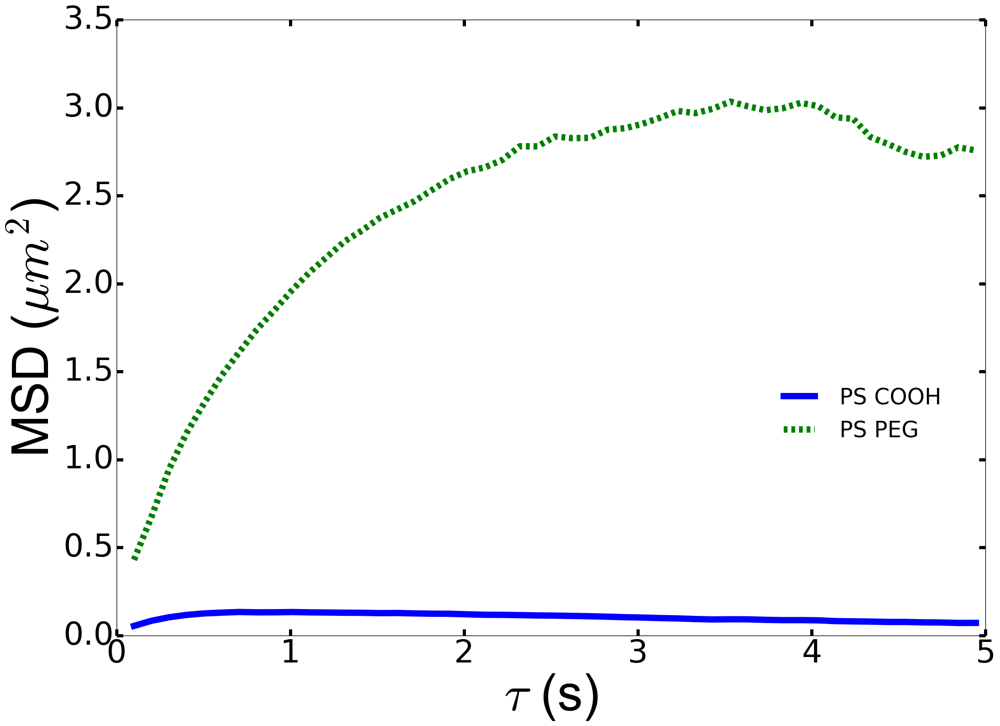

In [64]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_8[1][1:(np.ceil(5*fps_vals_8[0]))], MSD_dict_9[1][1:(np.ceil(5*fps_vals_8[0]))], linewidth=10, label = 'PS COOH')
ax.plot(time_dict_8[2][1:(np.ceil(5*fps_vals_8[1]))], MSD_dict_9[2][1:(np.ceil(5*fps_vals_8[1]))], linewidth=10, linestyle = '--', label = 'PS PEG')
ax.legend(loc = (0.75, 0.3),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('MPT in brain tissue_2.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

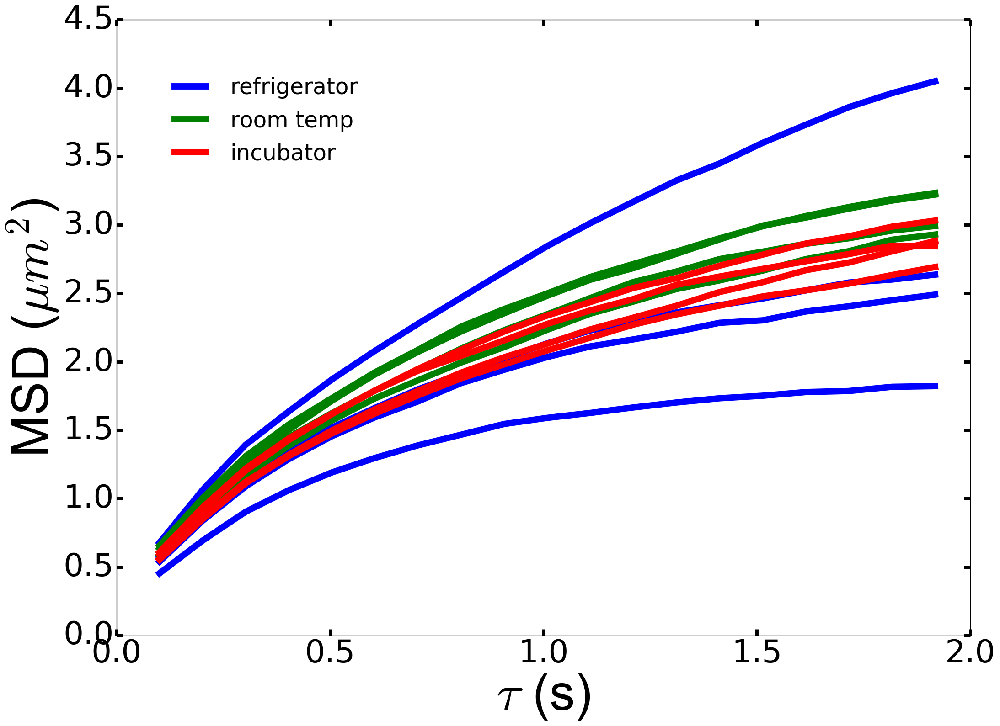

In [65]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[1][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'blue', label = 'refrigerator')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[2][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'blue')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[3][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'blue')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[4][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'blue')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[1][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'green', label = 'room temp')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[2][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'green')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[3][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'green')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[4][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'green')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[1][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'red', label = 'incubator')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[2][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'red')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[3][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'red')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[4][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, color = 'red')
ax.legend(loc = (0.05, 0.75),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('PS COOH effect of cooling rate.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

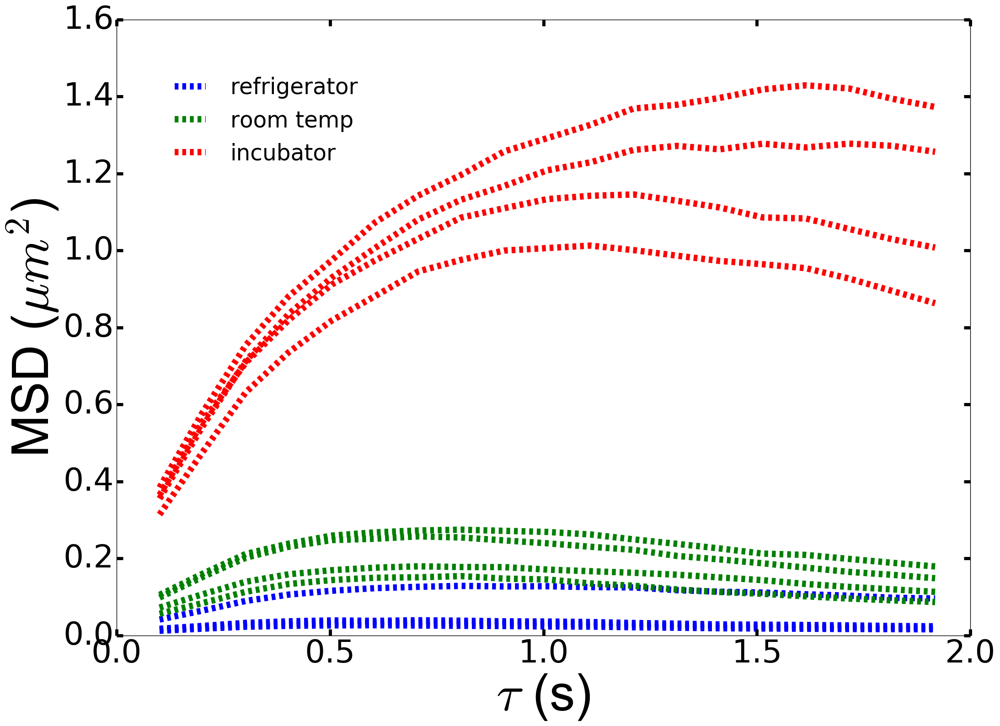

In [66]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[5][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'blue', label = 'refrigerator')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[6][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'blue')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[7][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'blue')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_10[8][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'blue')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[5][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'green', label = 'room temp')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[6][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'green')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[7][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'green')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_11[8][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'green')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[5][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'red', label = 'incubator')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[6][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'red')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[7][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'red')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_12[8][1:(np.ceil(2*fps_vals_8[0]))], linestyle = '--', linewidth=10, color = 'red')
ax.legend(loc = (0.05, 0.75),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('PS PEG effect of cooling rate.png', dpi=fig.dpi)

In [67]:
MSD_dict_13 = dict()

MSD_dict_13[1] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_1/geoM2xy_PS_COOH_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_13[2] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_3/geoM2xy_PS_COOH_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_13[3] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_5/geoM2xy_PS_COOH_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_13[4] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_7/geoM2xy_PS_COOH_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_13[5] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_2/geoM2xy_PS_PEG_in_0_1_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_13[6] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_4/geoM2xy_PS_PEG_in_0_2_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_13[7] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_6/geoM2xy_PS_PEG_in_0_4_agarose_gel_vid_1.csv', delimiter = ',')
MSD_dict_13[8] = np.genfromtxt('./Data_Files_Mike/9_19_17 - MPT varying agarose conc/well_8/geoM2xy_PS_PEG_in_0_8_agarose_gel_vid_1.csv', delimiter = ',')

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


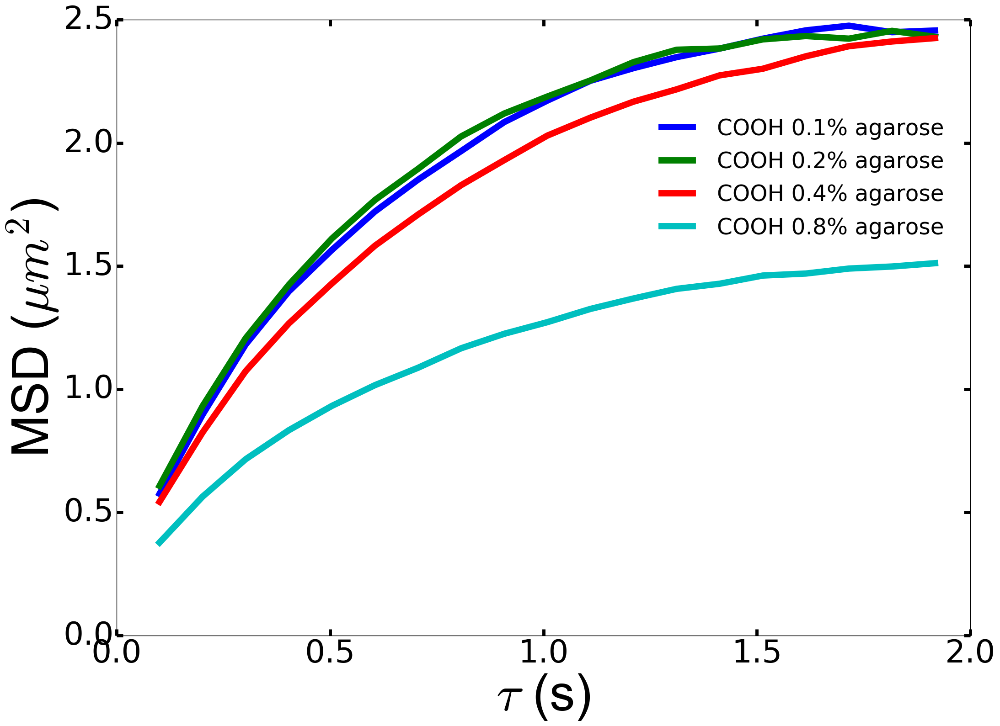

In [68]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[1][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, label = 'COOH 0.1% agarose')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[2][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, label = 'COOH 0.2% agarose')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[3][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, label = 'COOH 0.4% agarose')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[4][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, label = 'COOH 0.8% agarose')
ax.legend(loc = (0.62, 0.63),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('9.19.17 - COOH_MSDs_varying agarose conc_new.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


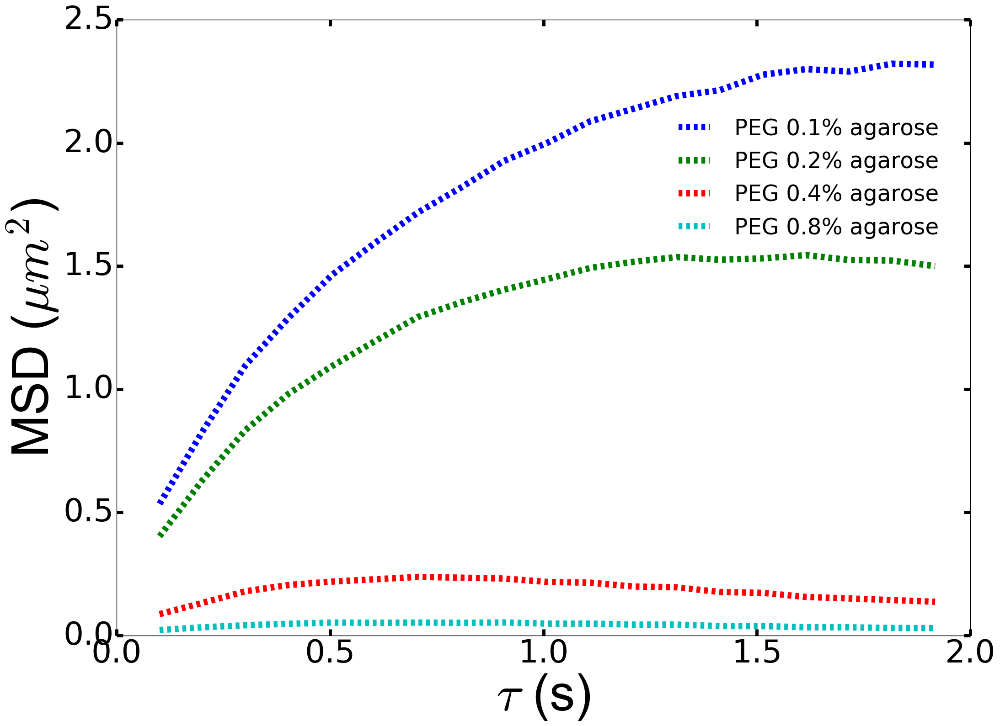

In [69]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[5][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, linestyle = '--', label = 'PEG 0.1% agarose')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[6][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, linestyle = '--', label = 'PEG 0.2% agarose')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[7][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, linestyle = '--', label = 'PEG 0.4% agarose')
ax.plot(time_dict_8[1][1:(np.ceil(2*fps_vals_8[0]))], MSD_dict_13[8][1:(np.ceil(2*fps_vals_8[0]))], linewidth=10, linestyle = '--', label = 'PEG 0.8% agarose')
ax.legend(loc = (0.64, 0.63),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('9.19.17 - PEG_MSDs_varying agarose conc_new.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


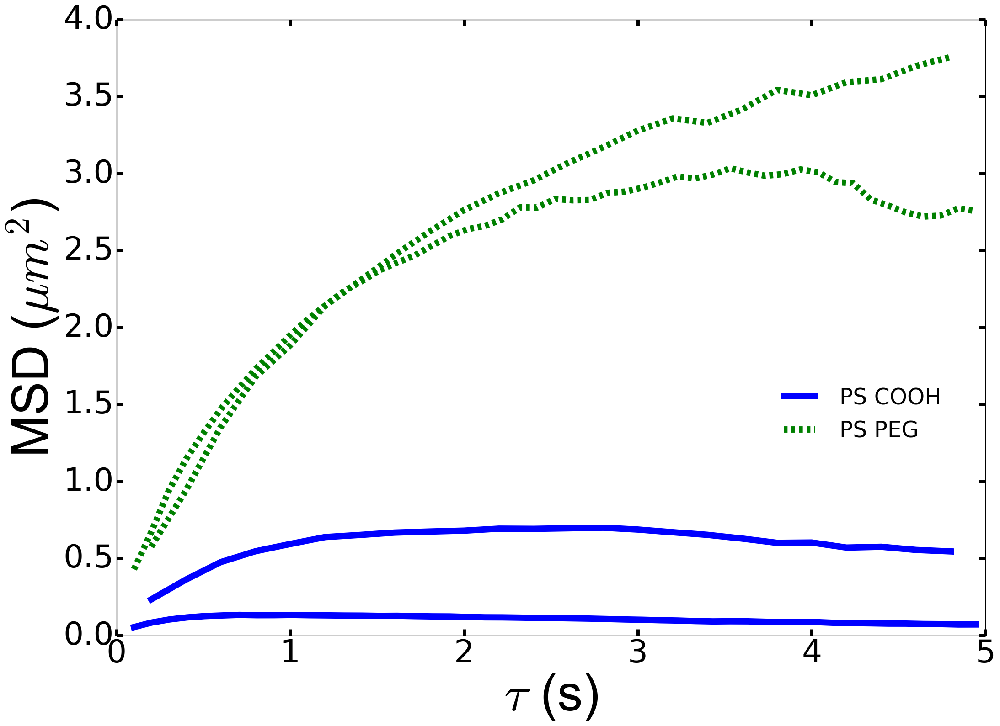

In [70]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_7[1][1:(np.ceil(5*fps_vals_7[0]))], MSD_dict_7[1][1:(np.ceil(5*fps_vals_7[0]))], linewidth=10, color = 'blue', label = 'PS COOH')
ax.plot(time_dict_7[2][1:(np.ceil(5*fps_vals_7[1]))], MSD_dict_7[2][1:(np.ceil(5*fps_vals_7[1]))], linewidth=10, linestyle = '--', color = 'green', label = 'PS PEG')
ax.plot(time_dict_8[1][1:(np.ceil(5*fps_vals_8[0]))], MSD_dict_9[1][1:(np.ceil(5*fps_vals_8[0]))], linewidth=10, color = 'blue')
ax.plot(time_dict_8[2][1:(np.ceil(5*fps_vals_8[1]))], MSD_dict_9[2][1:(np.ceil(5*fps_vals_8[1]))], linewidth=10, color = 'green', linestyle = '--')
ax.legend(loc = (0.75, 0.3),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('MPT in brain tissue_combo.png', dpi=fig.dpi)

/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:6: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.py:7: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/Users/mike_mckenna/Downloads/Users/mike_mckenna/Desktop/lib/python3.5/site-packages/ipykernel/__main__.

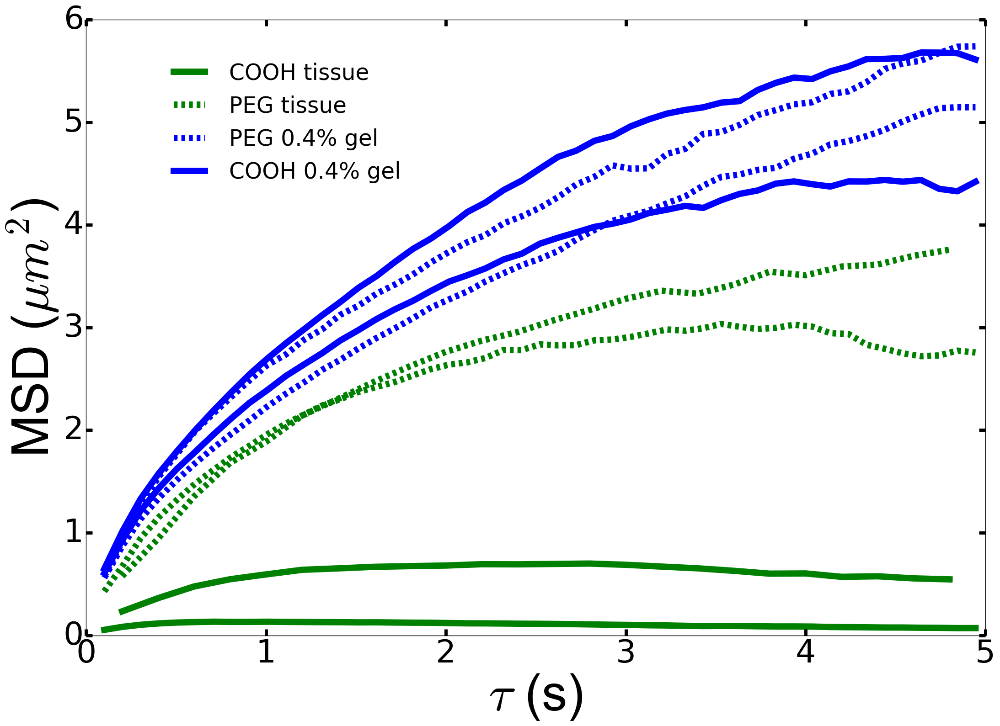

In [71]:
hfont = {'fontname':'Arial'}
fig = plt.figure(1,figsize=(22, 16), dpi=80)
ax = fig.add_subplot(111)
ax.plot(time_dict_7[1][1:(np.ceil(5*fps_vals_7[0]))], MSD_dict_7[1][1:(np.ceil(5*fps_vals_7[0]))], linewidth=10, color = 'green', label = 'COOH tissue')
ax.plot(time_dict_7[2][1:(np.ceil(5*fps_vals_7[1]))], MSD_dict_7[2][1:(np.ceil(5*fps_vals_7[1]))], linewidth=10, linestyle = '--', color = 'green', label = 'PEG tissue')
ax.plot(time_dict_8[1][1:(np.ceil(5*fps_vals_8[0]))], MSD_dict_9[1][1:(np.ceil(5*fps_vals_8[0]))], linewidth=10, color = 'green')
ax.plot(time_dict_8[2][1:(np.ceil(5*fps_vals_8[1]))], MSD_dict_9[2][1:(np.ceil(5*fps_vals_8[1]))], linewidth=10, color = 'green', linestyle = '--')
ax.plot(time_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[3][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', color = 'blue', label = 'PEG 0.4% gel')
ax.plot(time_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], MSD_dict_6[4][1:(np.ceil(5*fps_vals_6[0]))], linewidth=10, linestyle = '--', color = 'blue')
ax.plot(time_dict_4[9][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[9][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color='blue', label = 'COOH 0.4% gel')
ax.plot(time_dict_4[10][1:(np.ceil(5*fps_vals_4[0]))], MSD_dict_4[10][1:(np.ceil(5*fps_vals_4[0]))], linewidth=10, color='blue')
ax.legend(loc = (0.08, 0.72),frameon=False,fontsize=35)
ax.tick_params(axis='both', which='major', labelsize=50)
ax.xaxis.set_tick_params(width = 5, length = 10)
ax.yaxis.set_tick_params(width = 5, length = 10)
plt.xlabel(r'$\tau$ (s)', fontsize = 80, **hfont)
plt.ylabel(r'MSD ($\mu m^2$)', fontsize=80, **hfont)
fig.tight_layout()
plt.show()
fig.savefig('brain tissue gel comparison.png', dpi=fig.dpi)